In [1]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
from scipy.integrate import quad

from crc_scripts.io.gizmo import *
from crc_scripts import config
from crc_scripts.observations import dust_obs as obs
from crc_scripts.observations.obs_data import Observational_Data
import crc_scripts.utils.math_utils as math_utils
import crc_scripts.utils.snap_utils as snap_utils
import crc_scripts.utils.data_calc_utils as calc
import crc_scripts.utils.grain_size.grain_size_utils as grain_size_utils
from crc_scripts.figure import Figure,Projection
from crc_scripts.analysis.data_reduction import MultiSnapDataIO

import crc_scripts.analytical_models.grain_size_evo as gse_models

# First setup directory for all the plots
plot_dir = os.path.join(os.environ['SLATE'],'dust_size_evo/snap_check/')
os.makedirs(plot_dir, exist_ok=True)

### Load and Check Single Snapshot for Multiple Simulations

Set simulations to be loaded below.

In [38]:

main_dirc = '/N/project/choban_group/cchoban/gizmo_test/'

# Snapshot to check
snap_num = 90

snap_dirs = [
            #  main_dirc+'create_IC/output',
            #  main_dirc+'restart_IC/output',
             main_dirc+'restart2/output',
            ]
# Shorthand names for each sim used in plot legends and file names
sim_names = [
            #  'test_IC',
            #  'test_restart',
             'new_restart',

             ]


galaxies = []

In [2]:

main_dirc = '/N/project/choban_group/cchoban/size_evo_suite/variations/'

# Snapshot to check
snap_num = 100

snap_dirs = [
             #main_dirc+'new_HiRes/output',
             #main_dirc+'new_fiducial/output',
             main_dirc+'Fiducial/output',
             #main_dirc+'PassiveDust/output',
             #main_dirc+'CoagShatOnly/output',
             #main_dirc+'4xSNeDest/output',
            #  main_dirc+'4xCoag/output',
            # main_dirc+'10xVCoag/output',
            #  main_dirc+'NoSNeShat/output',
            ]
# Shorthand names for each sim used in plot legends and file names
sim_names = [
             #'high_res',
             #'new_fiducial',
             'Fiducial',
             #'passive',
             #'coagshat_only',
             #'4xSNeDest',
             #'4xCoag',
             #'10xVCoag',
             #'NoSneShat',
             ]


galaxies = []

In [20]:
main_dirc = '/N/project/choban_group/cchoban/size_evo_suite/preferred/'
main_dirc = '/N/project/choban_group/cchoban/size_evo_suite/IC_variations/'

# Snapshot to check
snap_num = 100

snap_dirs = [
             '/N/project/choban_group/cchoban/size_evo_suite/variations/20xCCoag/output',
             main_dirc+'m12_200CCoag/output',
            #  main_dirc+'m11/output',
            #  main_dirc+'m10/output',
            #  main_dirc+'m10_lessC/old_output',
            #  main_dirc+'m10_stardust/output',
            ]
# Shorthand names for each sim used in plot legends and file names
sim_names = [
             'm12_fid',
             'm12',
            #  'm11',
            #  'm10',
            #  'm10_lessC',
            #  'm10_stardust',
             ]


galaxies = []

#### Load Galaxies as Spherical Halos

In [28]:
# Halo parameters
halo_radius = 30. # kpc

file_prefix = 'halo'

galaxies=[]
for i,snap_dir in enumerate(snap_dirs):
    print("Snap Dirc: ",snap_dir)

    sp = load_snap(snap_dir, snap_num, cosmological=0)
    print(sp.time)
    halo = sp.loadhalo(mode=None)
    halo.set_zoom(rout=halo_radius, kpc=True)
    halo.set_orientation(ptype=4, mass_radius_max = 10, velocity_radius_max=10, radius_max=10, age_limits=[0,0.5])

    galaxies += [halo]

Snap Dirc:  /N/project/choban_group/cchoban/gizmo_test/restart_IC/output
1.0000000000000007
Centering galaxy on median position of gas particles with nH>10 cm^-3.
assigning center of galaxy:
  center position [kpc] = 0.110, 0.253, 0.002
  center velocity [km/s] = 0.5, -3.8, -0.2
assigning principal axes:
  using ptype 4 particles at radius < 10 kpc
  using ptype 4 particles with age = [0, 0.5] Gyr
  axis ratios:  min/maj = 0.029, min/med = 0.032, med/maj = 0.911


#### Load Galaxies as Disks

In [47]:
# Disk parameters
disk_radius = 9.6 # kpc ~2x the IC disk scale length
disk_scale_height = 0.5 # kpc ~2x the IC disk scale height

# disk_radius = 1.6 # kpc ~2x the IC disk scale length
# disk_scale_height = 0.5 # kpc ~2x the IC disk scale height

file_prefix = 'disk'

galaxies=[]
for i,snap_dir in enumerate(snap_dirs):
    print("Snap Dirc: ",snap_dir)

    sp = load_snap(snap_dir, snap_num, cosmological=0)
    disk = sp.loadhalo(mode=None)
    disk.set_disk(rmax = disk_radius, height=disk_scale_height)
    disk.set_orientation(ptype=4, mass_radius_max = 10, velocity_radius_max=10, radius_max=10, age_limits=[0,0.5])
    galaxies += [disk]

Snap Dirc:  /N/project/choban_group/cchoban/gizmo_test/restart2/output
Centering galaxy on median position of gas particles with nH>10 cm^-3.
assigning center of galaxy:
  center position [kpc] = -0.053, -0.204, 0.048
  center velocity [km/s] = -2.7, 4.6, 1.1
assigning principal axes:
  using ptype 4 particles at radius < 10 kpc
  using ptype 4 particles with age = [0, 0.5] Gyr
  axis ratios:  min/maj = 0.031, min/med = 0.032, med/maj = 0.939


#### Quick Check of Global Galaxy Properties

In [29]:
ISM_phases = ['cold','warm','hot','coronal']

for i,halo in enumerate(galaxies):
    name = sim_names[i]
    print(halo.sp.npart)

    print(name)
    G=halo.loadpart(0)
    new_S=halo.loadpart(4, append_dummies=False)
    disk_S = halo.loadpart(2)
    bulge_S = halo.loadpart(3)
    BH = halo.loadpart(5)

    gas_mass = G.get_property('mass')
    new_star_mass = new_S.get_property('mass')
    disk_star_mass = disk_S.get_property('mass')
    bulge_star_mass = bulge_S.get_property('mass')
    Z = G.get_property('Z')
    H2_mass = G.get_property('M_H2')
    dust_mass = G.get_property('M_dust')
    spec_mass = G.get_property('M_spec')
    DZ = G.get_property('D/Z')

    print('gas mass', np.sum(gas_mass)/1E10)
    print('new star mass', np.sum(new_star_mass)/1E10)
    print('disk star mass', np.sum(disk_star_mass)/1E10)
    print('bulge star mass', np.sum(bulge_star_mass)/1E10)
    print('BH mass', np.sum(BH.get_property('mass'))/1E10)
    print('total star+gas mass', (np.sum(gas_mass)+np.sum(new_star_mass)+np.sum(disk_star_mass)+np.sum(bulge_star_mass))/1E10)
    
    print('median Z', np.median(Z))
    print('H2 mass', np.sum(H2_mass)/1E10)
    print('dust mass', np.sum(dust_mass)/1E10)
    print('spec mass', np.sum(spec_mass,axis=0)/1E10)
    print('median D/Z', np.median(DZ))

    for i,phase in enumerate(ISM_phases):
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        print(phase,"phase gas mass:",np.sum(gas_mass[mask])/1E10)

    # mach_num = G.get_property('mach_number')
    # temp = G.get_property('temperature')
    # T_clumping_factor = G.get_property('T_clumping_factor')
    # Tcut = 1000
    # T_cutoff = temp <= Tcut
    # print("For Tcut = ", Tcut)
    # print("T<Tcut gas mass:",np.sum(gas_mass[T_cutoff])/1E10)
    # T_cutoff = temp*T_clumping_factor <= Tcut
    # print("T<Tcut*T_clump gas mass:",np.sum(gas_mass[T_cutoff])/1E10)

    # Tcut = 300
    # T_cutoff = temp <= Tcut
    # print("For Tcut = ", Tcut)
    # print("T<Tcut gas mass:",np.sum(gas_mass[T_cutoff])/1E10)
    # T_cutoff = temp*T_clumping_factor <= Tcut
    # print("T<Tcut*T_clump gas mass:",np.sum(gas_mass[T_cutoff])/1E10)
        

[3817023 2110000 4070000  450000  403067       1]
m11
Property M_dust given to Particle with ptype 0 is not supported. Returning -1 array.
Property M_spec given to Particle with ptype 0 is not supported. Returning -1 array.
Property D/Z given to Particle with ptype 0 is not supported. Returning -1 array.
gas mass 0.2611671296
new star mass 0.0249430912
disk star mass 0.2881637632
bulge star mass 0.031072128
BH mass 4e-05
total star+gas mass 0.6053460992
median Z 0.48287782
H2 mass 0.0017882926
dust mass -0.0003600656
spec mass -0.0003600656
median D/Z -1.0
cold phase gas mass: 0.0031884168
warm phase gas mass: 0.0154648096
hot phase gas mass: 0.2395951872
coronal phase gas mass: 0.0009769282


#### Snapshot Projections

/N/project/choban_group/cchoban/gizmo_test/restart2/output


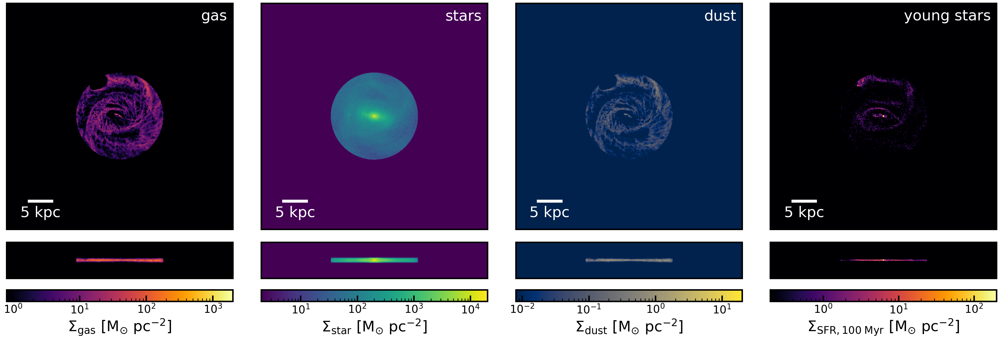

In [40]:

foutname = 'snapshot_projections.pdf'

# Physical size of projection 
proj_L = 15 # kpc
# Size resolution (kpc) for each "pixel" in projection
pixel_res=0.05
# Properties to plot projections of. Can be surface densities (total mass in pixel divided by pixel size) or properties like T (median value of all particles in pixel)
properties = ['sigma_gas','sigma_star','sigma_dust','sigma_sfr_100Myr']
# Limits for projection of each property. Defaults if not set
prop_limits = [[8E-1,2E3],[2E0,2E4],[8E-3,2E1],[2E-1,2E2]]
# Colormaps for each projection
prop_cmaps = ['inferno','viridis','cividis','inferno']
# Do you want log colormaps for each property (default = True)
log_cmaps = [True]*len(properties)
# Labels for each projection is so desired
labels = ['gas','stars','dust','young stars']
# Physical size of projection 
proj_L = [50,50,20,10] # kpc
proj_L = [50,50,50] # kpc
# Do you want a secondary projection from an orthogonal axis (i.e. edge-on)
sub_proj = True
# size of secondary projection
sub_L = 8 # kpc



for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    # Initialize projection figure
    L = proj_L[i]
    height_ratios = [L/sub_L,1]
    new_proj = Projection(len(properties), add_sub_proj=sub_proj, add_colorbars=True, height_ratios=height_ratios)
    # Create projections for each property and plot the projection
    for j,prop in enumerate(properties):
        new_proj.set_proj_axis(j, prop, L, axes_visible=False)
        # Create x-y projection using a 2D histogram
        # main_X, main_Y, main_pixel_stats = calc.calc_projected_prop_meshoid(prop, halo, L, pixel_res=pixel_res, proj='xy')
        # if sub_proj:
        #     # Create x-z subprojection using a 2D histogram
        #     sub_X, sub_Y, sub_pixel_stats = calc.calc_projected_prop_meshoid(prop, halo, L, pixel_res=pixel_res, proj='xz')
        # else:
        #     sub_X, sub_Y, sub_pixel_stats = None, None, None

        main_pixel_stats,_,_, main_extent = calc.calc_projected_prop_hist(prop, halo, [L, L, sub_L], pixel_res=pixel_res, proj='xy')
        if sub_proj:
            # Create x-z subprojection using a 2D histogram
            sub_pixel_stats,_,_, sub_extent = calc.calc_projected_prop_hist(prop, halo, [L, L, sub_L], pixel_res=pixel_res, proj='xz')
        else:
            sub_pixel_stats, sub_extent = None, None
        # x-z projection
        # Create the projection
        if labels is not None:
            label = labels[j]
        else:
            label=None


        # new_proj.plot_projection(j, main_pixel_stats, main_X=main_X, main_Y=main_Y, sub_proj_data=sub_pixel_stats, sub_X=sub_X, sub_Y=sub_Y,
        #                             cmap= prop_cmaps[j], v_limits = prop_limits[j],v_log=log_cmaps[j], label=label, use_imshow=False)
        new_proj.plot_projection(j, main_pixel_stats, main_extent=main_extent, sub_proj_data=sub_pixel_stats, sub_extent=sub_extent,
                                    cmap= prop_cmaps[j], v_limits = prop_limits[j],v_log=log_cmaps[j], label=label, use_imshow=True)
        
    new_proj.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

#### Archeological Star Formation History

/N/project/choban_group/cchoban/gizmo_test/restart2/output


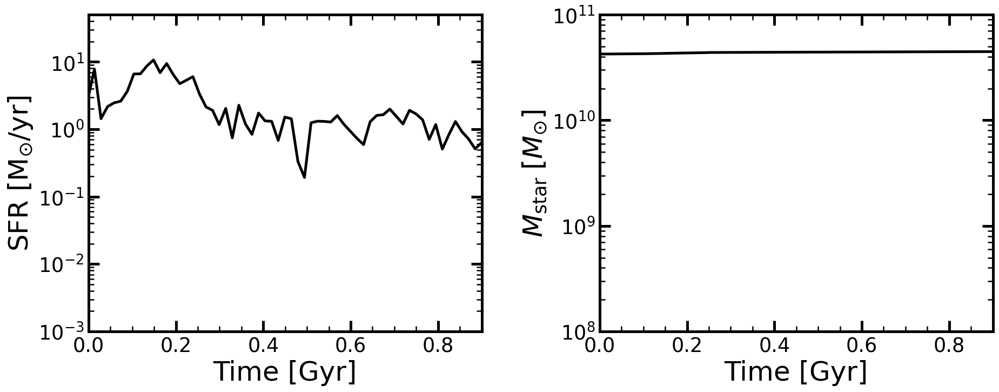

In [41]:
foutname = 'SFH.pdf'


for i,halo in enumerate(galaxies):
    print(halo.sp.sdir)
    name = sim_names[i]

    time, cum_SFH = snap_utils.get_SFH(halo, cum=1)

    stars = halo.loadpart(4)
    sft, m = stars.get_property('sft'), stars.get_property('M_form')
    time, sfr = math_utils.SFH(sft, m, halo, dt=0.001, cum=False)

    fig = Figure(2,ncols=2)

    time_lims = [0,halo.sp.time]

    fig.set_axis(0, 'time', 'sfr', x_lim=time_lims,x_log=False,twin_time_axis=False)
    fig.set_axis(1, 'time', 'M_star', x_lim=time_lims,x_log=False,twin_time_axis=False)


    fig.plot_line_data(0,time,sfr)

    fig.plot_line_data(1,time,cum_SFH)


    fig.save(plot_dir+name+'_'+str(halo.sp.snum)+'_'+file_prefix+'_'+foutname)


#### Comparing gas phase diagram when accounting for clumping factor.

/N/project/choban_group/cchoban/gizmo_test/restart2/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:568: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


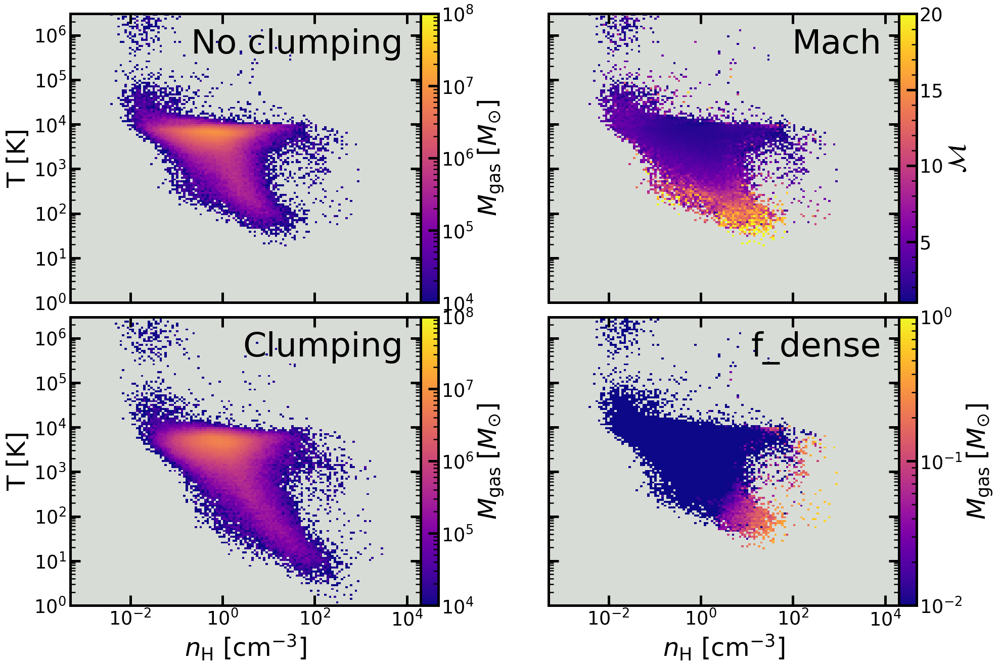

In [42]:
foutname = 'clumping_factor_phase_diagram.pdf'
prop = 'M_gas'
z_logs=[True]
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-4,2E4]
T_lims = [1,3E6]

prop_lims=[[1E4,1E8],[1,20],[1E4,1E8],[0.01,1]]


for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    fig = Figure(4,ncols=2, sharey=True, sharex=True)

    j=0
    # Set up for each plot
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=False)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[0],label='No clumping')

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop=prop)

    j+=1
    # Set up for each plot
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data('mach_number', halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=False)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=False,label='Mach')

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop='mach_number')

    j+=1
    # Set up for each plot
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=True)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[0],label='Clumping')
    fig.add_colorbar(j,cbar_prop=prop)

    j+=1
    # Set up for each plot
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    ret = calc.calc_phase_hist_data('f_dense', halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, factor_clumping=False)
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[0],label='f_dense')

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop=prop)


    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

##### Select gas projections (used to investigate where phase space gas is in projection space)

/N/project/choban_group/cchoban/size_evo_suite/IC/fiducial/output
14684
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
/N/project/choban_group/cchoban/size_evo_suite/preferred/m12_lowresstars/output
124923
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
/N/project/choban_group/cchoban/size_evo_suite/preferred/m11/output
40512
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
/N/project/choban_group/cchoban/size_evo_suite/preferred/m10/output
2130
Property size given to Particle with ptype 4 is not supported. Returning -1 array.
Property size given to Particle with ptype 4 is not supported. Returning -1 array.


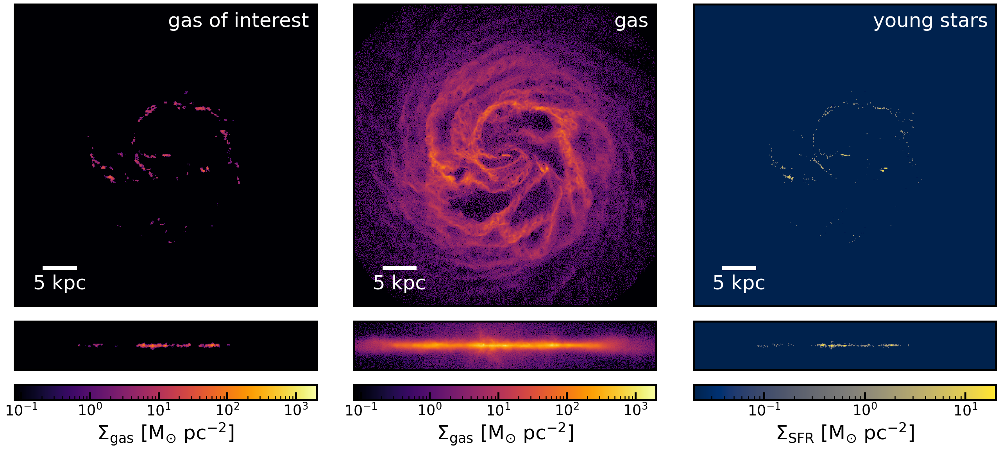

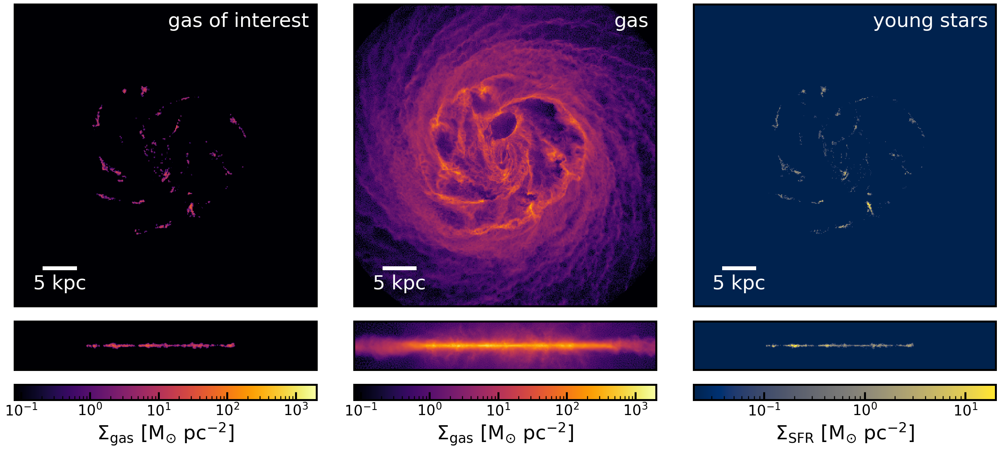

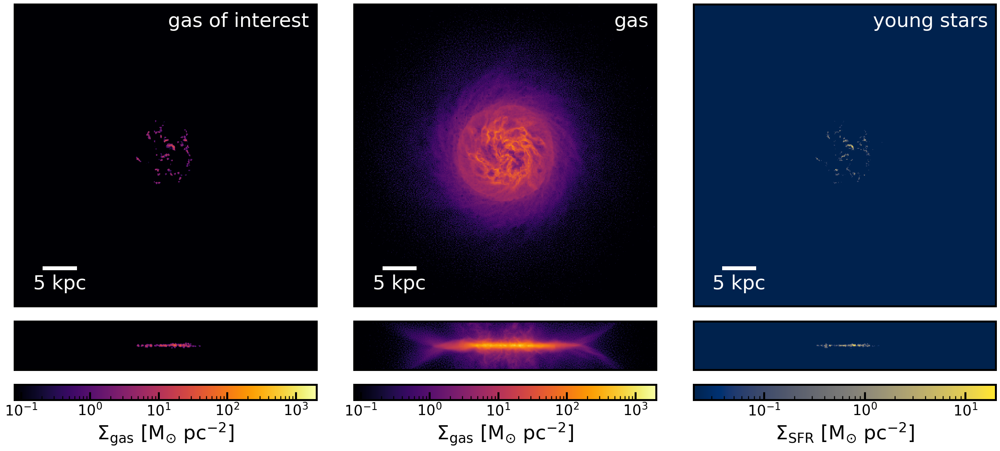

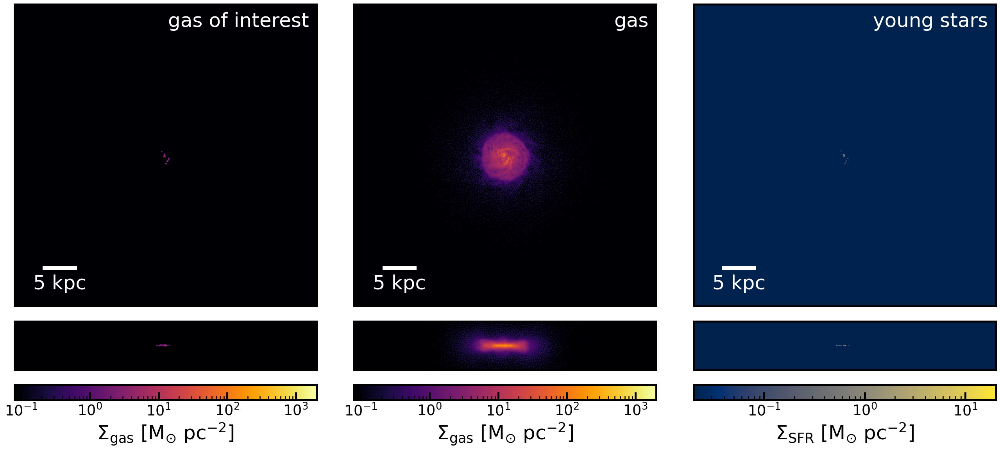

In [20]:

foutname = 'gas_test_projections.pdf'

# Physical size of projection 
proj_L = 10 # kpc
# Size resolution (kpc) for each "pixel" in projection
pixel_res=0.1
# Properties to plot projections of. Can be surface densities (total mass in pixel divided by pixel size) or properties like T (median value of all particles in pixel)
properties = ['sigma_gas','sigma_gas','sigma_sfr']
# Limits for projection of each property. Defaults if not set
prop_limits = [[8E-2,2E3],[8E-2,2E3],[2E-2,2E1]]
# Colormaps for each projection
prop_cmaps = ['inferno','inferno','cividis']
# Do you want log colormaps for each property (default = True)
log_cmaps = [True]*len(properties)
# Labels for each projection is so desired
labels = ['gas of interest','gas','young stars']
# Physical size of projection 
proj_L = 50 # kpc
# Do you want a secondary projection from an orthogonal axis (i.e. edge-on)
sub_proj = True
# size of secondary projection
sub_L = 8 # kpc



for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    # Initialize projection figure
    L = proj_L
    height_ratios = [L/sub_L,1]
    new_proj = Projection(len(properties), add_sub_proj=sub_proj, add_colorbars=True, height_ratios=height_ratios)
    # Create projections for each property and plot the projection
    for j,prop in enumerate(properties):
        new_proj.set_proj_axis(j, prop, L, axes_visible=False)

        if prop == 'sigma_gas' and j==0:
            G = sp.loadpart(0)
            nH = G.get_property('nH')
            T = G.get_property('temperature')
            mask = (nH>3E0) & (T>=5E3) & (T>=2E4)
            mask = (nH>2E0) &  (T>=2E4)
            print(len(nH[mask]))
        else: mask = None
        # Create x-y projection using a 2D histogram
        main_pixel_stats, main_xedges, main_yedges, main_extent = calc.calc_projected_prop(prop, halo, [L,L,L], pixel_res=pixel_res, proj='xy', mask=mask)
        if sub_proj:
            # Create x-z subprojection using a 2D histogram
            sub_pixel_stats, sub_xedges, sub_yedges, sub_extent = calc.calc_projected_prop(prop, halo, [L,sub_L,L], pixel_res=pixel_res, proj='xz', mask=mask)
        else:
            sub_pixel_stats=None; sub_extent=None
        # x-z projection
        # Create the projection
        if labels is not None:
            label = labels[j]
        else:
            label=None
        new_proj.plot_projection(j, main_pixel_stats, main_extent, sub_proj_data=sub_pixel_stats, sub_extent=sub_extent,
                                    cmap= prop_cmaps[j], v_limits = prop_limits[j],v_log=log_cmaps[j], label=label)
        
    new_proj.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

#### Mach Number relation with density and temperature

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
/N/project/choban_group/cchoban/size_evo_suite/IC_variations/m12_200CCoag/output


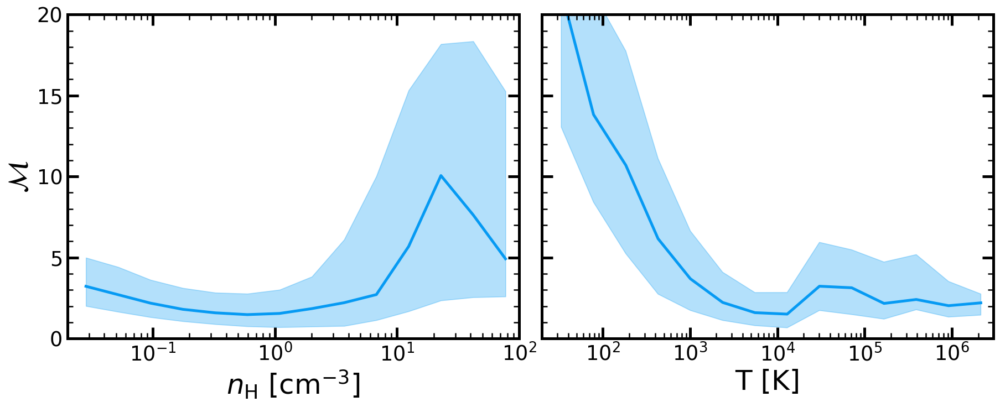

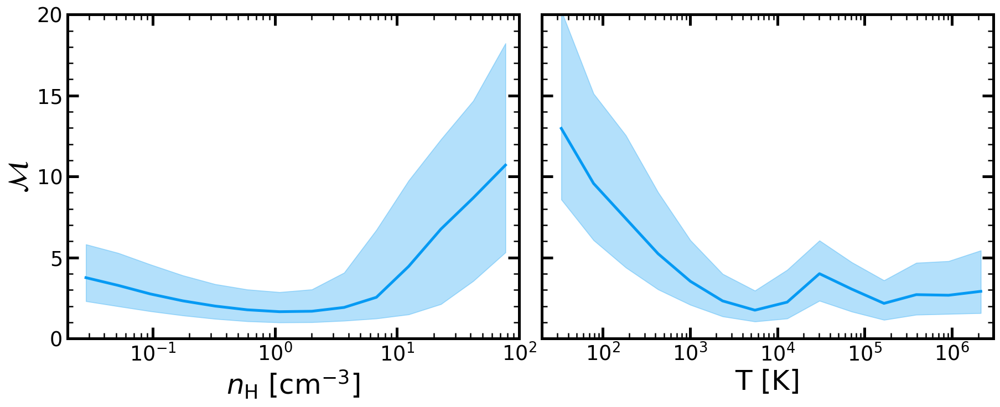

In [15]:


foutname = 'Mach_vs_dens_T.pdf'

nH_lims = [2E-2,1E2]
T_lims = [20,3E6]

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    gas = halo.loadpart(0)

    fig = Figure(2,ncols=2, sharey=True)
    num_snaps = len(galaxies)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH

    fig.set_axis(0, 'nH', 'mach_number',x_lim=nH_lims)
    fig.set_axis(1, 'T', 'mach_number',x_lim=T_lims)


    bin_nums=15

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, 'mach_number','nH', bin_nums=bin_nums,prop_lims=nH_lims)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, 'mach_number','T', bin_nums=bin_nums,prop_lims=T_lims)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### f_dense relation with density

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:567: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


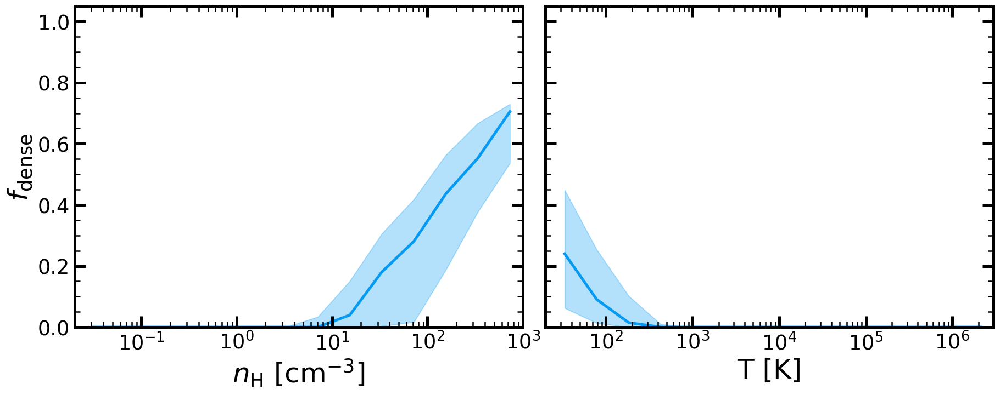

In [42]:


foutname = 'fdense_vs_dens_T.pdf'

nH_lims = [2E-2,1E3]
T_lims = [20,3E6]

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    gas = halo.loadpart(0)

    fig = Figure(2,ncols=2, sharey=True)
    num_snaps = len(galaxies)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH

    fig.set_axis(0, 'nH', 'f_dense',x_lim=nH_lims)
    fig.set_axis(1, 'T', 'f_dense',x_lim=T_lims)


    bin_nums=15

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, 'f_dense','nH', bin_nums=bin_nums,prop_lims=nH_lims)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, 'f_dense','T', bin_nums=bin_nums,prop_lims=T_lims)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### Clumping Factor

/N/project/choban_group/cchoban/size_evo_suite/preferred/m11/output
Property mach_number given to Particle with ptype 0 is not supported. Returning -1 array.
Property clumping_factor given to Particle with ptype 0 is not supported. Returning -1 array.
Property clumping_factor given to Particle with ptype 0 is not supported. Returning -1 array.


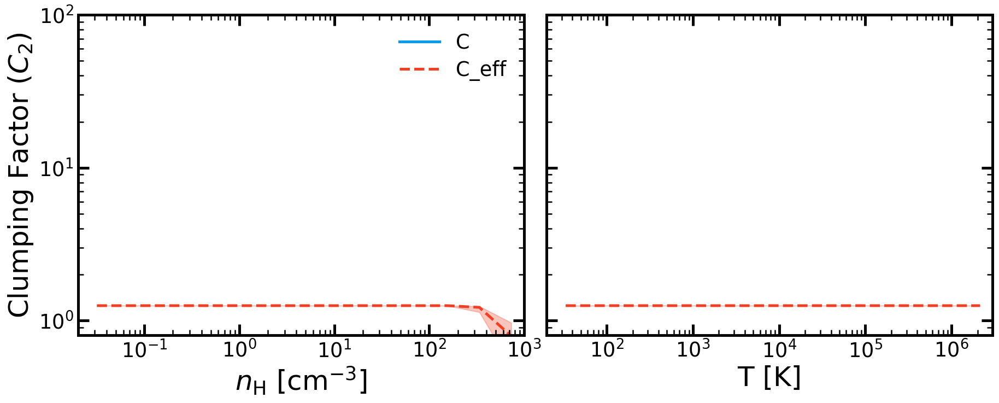

In [64]:


foutname = 'Clump_factor_vs_dens_T.pdf'

nH_lims = [2E-2,1E3]
T_lims = [20,3E6]

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    gas = halo.loadpart(0)

    fig = Figure(2,ncols=2, sharey=True)
    num_snaps = 2
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH

    fig.set_axis(0, 'nH', 'clumping_factor',x_lim=nH_lims)
    fig.set_axis(1, 'T', 'clumping_factor',x_lim=T_lims)

    M = gas.get_property('mach_number')
    b=0.5
    n_dense = 1E3 # cm^-3 assuming dense gas is higher than this
    s_dense = np.log(n_dense/gas.get_property('nH'))
    sigma_squared = np.log(1+b*b*M*M)
    from scipy.special import erfc,erf
    C_eff = np.exp(sigma_squared)/2*erfc((3*sigma_squared/2 - s_dense)/(np.sqrt(2*sigma_squared)));


    bin_nums=15

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, 'clumping_factor','nH', bin_nums=bin_nums,prop_lims=nH_lims)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0], label='C')
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, C_eff,'nH', bin_nums=bin_nums,prop_lims=nH_lims)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[1],linestyle=linestyles[1], label='C_eff')
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[1])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, 'clumping_factor','T', bin_nums=bin_nums,prop_lims=T_lims)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas, C_eff,'T', bin_nums=bin_nums,prop_lims=T_lims)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[1],linestyle=linestyles[1])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[1])

    fig.set_all_legends()

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### Phase Diagrams

/N/project/choban_group/cchoban/gizmo_test/restart_IC/output


/N/slate/cchoban/codes/crc_scripts/src/crc_scripts/io/particle.py:568: RuntimeWarning: divide by zero encountered in divide
  f_dense = 1/2 + 1/2 * erf((sigma_squared/2-s_dense)/np.sqrt(2*sigma_squared))


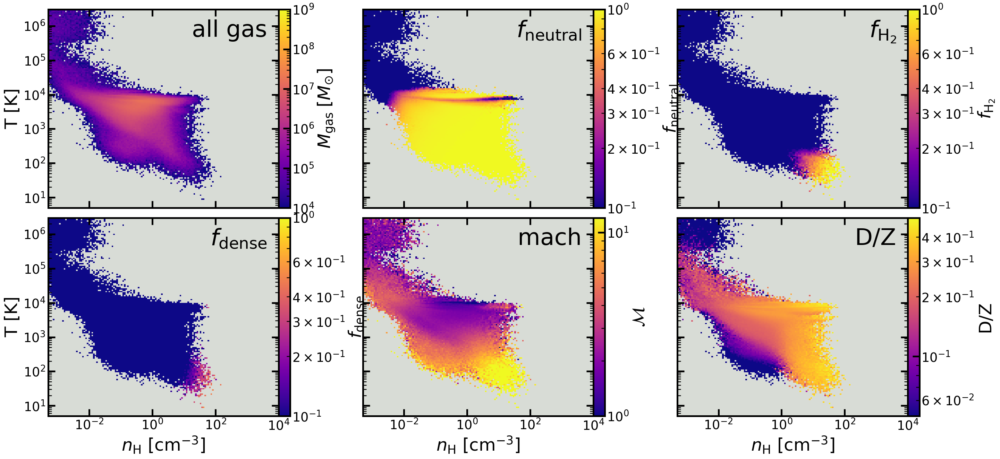

In [31]:
foutname = 'phase_diagram.pdf'

# Do you want to factor in the clumping factor when calculating nH/T for the phase diagram?
clumping_flag = False

props = ['M_gas','f_neutral','f_H2','f_dense','mach_number','D/Z']
fig_labels = ['all gas',r'$f_{\rm neutral}$',r'$f_{\rm H_2}$',r'$f_{\rm dense}$','mach','D/Z']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-4,1E4]
T_lims = [5,3E6]

prop_lims=[[1E4,1E9],[0.1,1],[0.1,1],[0.1,1],[1,12],[0.05,0.5]]


for i,halo in enumerate(galaxies):
    sp=halo.sp
    print(sp.sdir)
    name = sim_names[i]

    fig = Figure(len(props),ncols=3, sharex='col',sharey='row')

    for j,prop in enumerate(props):
        # Set up for each plot
        if not clumping_flag:
            fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        else:
            fig.set_axis(j, 'nH_rms', 'T_eff', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        
        ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims,factor_clumping=clumping_flag)
        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop=prop)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

#### Dust Phase Diagrams

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output


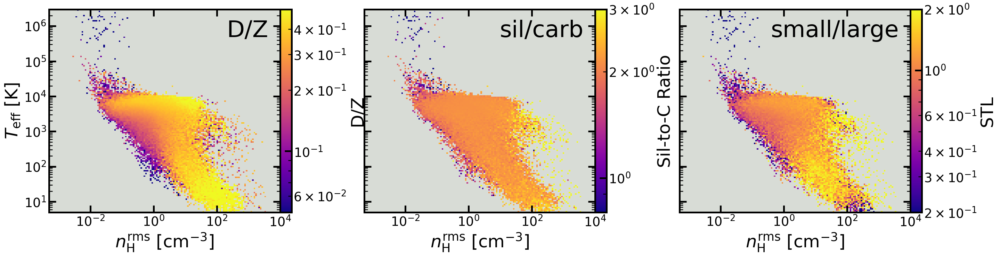

In [8]:
foutname = 'dust_phase_diagram.pdf'

# Do you want to factor in the clumping factor when calculating nH/T for the phase diagram?
clumping_flag = True
a_small = 0.02 # micron
props = ['D/Z','Si/C','S/L']
fig_labels = ['D/Z','sil/carb','small/large']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-4,1E4]
T_lims = [5,3E6]

prop_lims=[[0.05,0.5],[0.8,3],[0.2,2]]


for i,halo in enumerate(galaxies):
    sp=halo.sp
    print(sp.sdir)
    name = sim_names[i]
    G = halo.loadpart(0)

    fig = Figure(len(props),ncols=3, sharex='col',sharey='row')

    for j,prop in enumerate(props):
        # Set up for each plot
        if not clumping_flag:
            fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        else:
            fig.set_axis(j, 'nH_rms', 'T_eff', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        
        if prop == 'S/L':   
            grain_bin_mass = G.get_property('grain_bin_mass')
            large_bins = halo.sp.Grain_Bin_Centers > a_small
            small_bins = ~large_bins
            large_grain_bin_mass = np.sum(grain_bin_mass[:,:,large_bins],axis=(1,2))
            small_grain_bin_mass = np.sum(grain_bin_mass[:,:,small_bins],axis=(1,2))
            prop_data = small_grain_bin_mass / large_grain_bin_mass            
            ret = calc.calc_phase_hist_data(prop_data, halo, bin_nums=bin_nums, nH_lims=nH_lims, 
                                            T_lims=T_lims, factor_clumping=clumping_flag, bin_func='median')
        else:
            ret = calc.calc_phase_hist_data(prop, halo, bin_nums=bin_nums, nH_lims=nH_lims, 
                                            T_lims=T_lims, factor_clumping=clumping_flag)
        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop=prop)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

#### D/Z trends with Gas Density and Temperature

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output


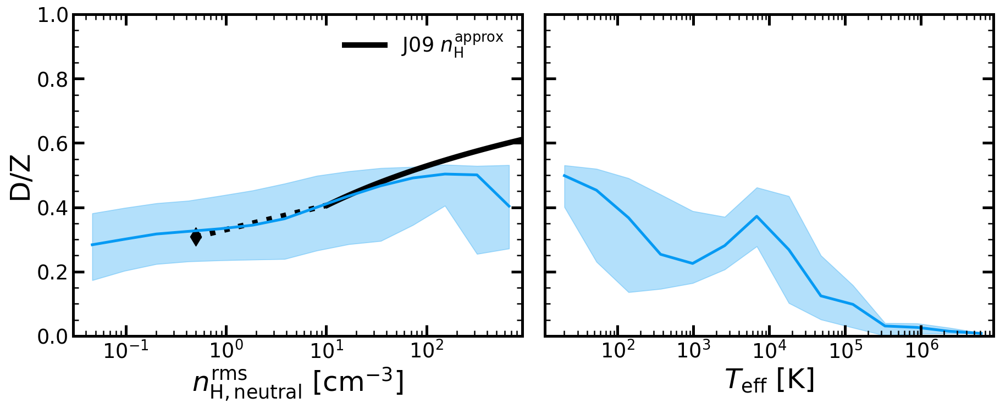

In [137]:


include_observations = True

# Flag to account for clumping in nH and T
clumping_flag = True

if clumping_flag: foutname = 'DZ_vs_rmsdens_Teff.pdf'
else: foutname = 'DZ_vs_dens_T.pdf'

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    gas = halo.loadpart(0)

    fig = Figure(2,ncols=2, sharey='row')
    num_snaps = len(galaxies)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH
    init_depl = 0

    # number of points per bin
    # Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
    points_per_bin=1

    nH_prop = 'nH_neutral_rms' if clumping_flag else 'nH_neutral'
    T_prop = 'T_eff' if clumping_flag else 'T'

    fig.set_axis(0, nH_prop, 'D/Z', y_lim=[0,1],y_log=False)
    fig.set_axis(1, T_prop, 'D/Z', y_lim=[0,1],y_log=False)


    if include_observations:
        density_vals, DZ_vals = obs.Jenkins_2009_DZ_vs_dens(phys_dens=True, elem='Z')
        fig.plot_line_data(0, density_vals, DZ_vals, label=r'J09 $n_{\rm H}^{\rm approx}$', color='xkcd:black',linestyle='-',linewidth=linewidth)
        WNM_dens, WNM_DZ, WNM_error = obs.Jenkins_Savage_2009_WNM_Depl('Z')
        fig.plot_line_data(0, [WNM_dens,density_vals[0]], [WNM_DZ,DZ_vals[0]], color='xkcd:black',linestyle=':',linewidth=linewidth)
        fig.plot_scatter_data(0, [WNM_dens], [WNM_DZ], c='xkcd:black',marker='d',s=2*config.BASE_MARKERSIZE)

    bin_nums=15
    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas,'D/Z',nH_prop,bin_nums=bin_nums)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas,'D/Z',T_prop,bin_nums=bin_nums)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    fig.set_all_legends()
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### S/L trends with Gas Density and Temperature

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output


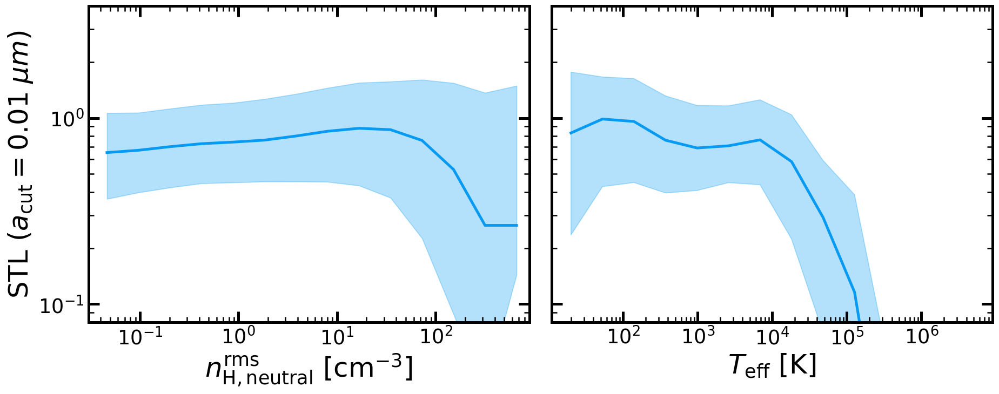

In [26]:

# Flag to account for clumping in nH and T
clumping_flag = True

a_small = 0.01 # micron
y_label = r'STL ($a_{\rm cut}=%2g\;\mu m$)'%a_small

if clumping_flag: foutname = 'SL_vs_rmsdens_Teff.pdf'
else: foutname = 'SL_vs_dens_T.pdf'

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]
    G = halo.loadpart(0)

    fig = Figure(2,ncols=2, sharey='row')
    num_snaps = len(galaxies)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH

    # number of points per bin
    # Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
    points_per_bin=1

    nH_prop = 'nH_neutral_rms' if clumping_flag else 'nH_neutral'
    T_prop = 'T_eff' if clumping_flag else 'T'

    fig.set_axis(0, nH_prop, 'S/L', y_lim=[0.08,4],y_log=True, y_label=y_label)
    fig.set_axis(1, T_prop, 'S/L', y_lim=[0.08,4],y_log=True, y_label=y_label)

    grain_bin_mass = G.get_property('grain_bin_mass')
    large_bins = halo.sp.Grain_Bin_Centers > a_small
    small_bins = ~large_bins
    large_grain_bin_mass = np.sum(grain_bin_mass[:,:,large_bins],axis=(1,2))
    small_grain_bin_mass = np.sum(grain_bin_mass[:,:,small_bins],axis=(1,2))
    prop_data = small_grain_bin_mass / large_grain_bin_mass            


    bin_nums=15
    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(G,prop_data,nH_prop,bin_nums=bin_nums)
    fig.plot_line_data(0,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(0,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(G,prop_data,T_prop,bin_nums=bin_nums)
    fig.plot_line_data(1,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
    fig.plot_shaded_region(1,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])

    fig.set_all_legends()
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### Depletion Trends

/N/project/choban_group/cchoban/size_evo_suite/IC_variations/m10/output
/N/project/choban_group/cchoban/size_evo_suite/IC_variations/m10_lessC/output


Exception ignored in: <function WeakKeyDictionary.__init__.<locals>.remove at 0x7f24e887a840>
Traceback (most recent call last):
  File "/N/slate/cchoban/conda/Quartz/envs/jupyter/lib/python3.11/weakref.py", line 369, in remove
    def remove(k, selfref=ref(self)):

KeyboardInterrupt: 


/N/project/choban_group/cchoban/size_evo_suite/IC_variations/m10_stardust/output


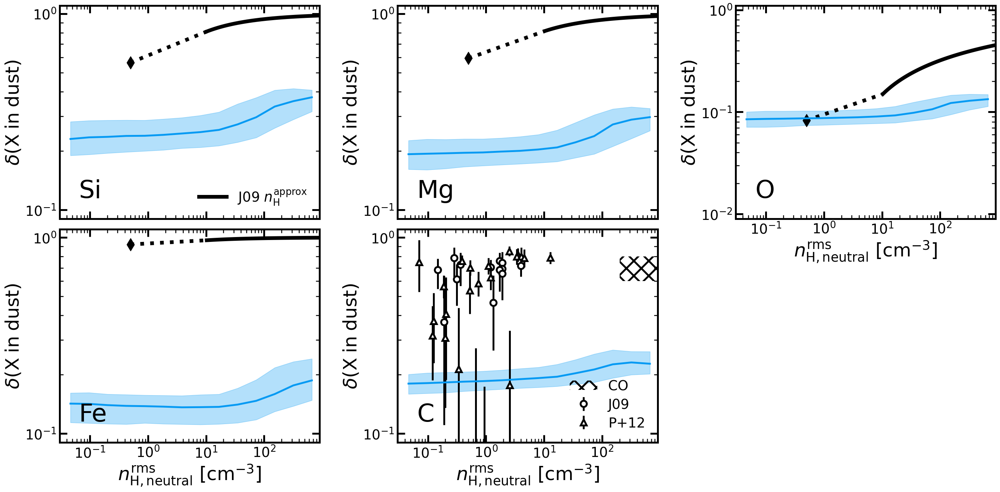

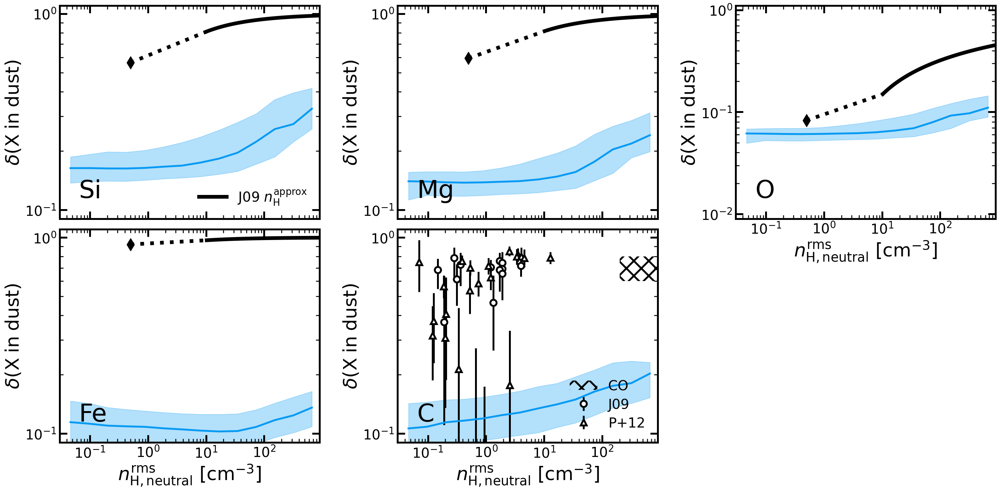

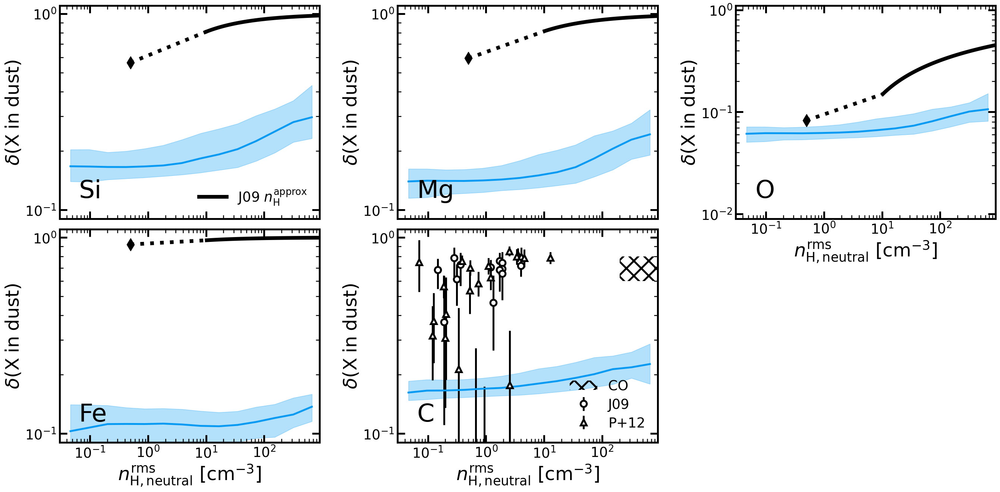

In [18]:


# Set if you want to plot elements in dust instead of elements missing from gas
element_in_dust = True
# Flag to account for clumping in nH and T
clumping_flag = True
# Include Jenkins 09 observations
include_observations = True

if element_in_dust: depl_str = 'dust_depletion'
else: depl_str = 'gas_depletion'
if clumping_flag: dens_str = 'rms_density'
else: dens_str = 'density'
foutname = depl_str + '_' + dens_str + '_trends.pdf'

elements= ['Si','Mg','O','Fe','C']
if element_in_dust:
    depl_lims = [[0.9E-1,1.1],[0.9E-1,1.1],[0.9E-2,1.1],[0.9E-1,1.1],[0.9E-1,1.1]]
else:
    depl_lims = [[0.9E-2,1.1],[0.9E-2,1.1],[0.9E-1,1.1],[0.9E-2,1.1],[0.9E-1,1.1]]
num_elems = len(elements)



for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    gas = halo.loadpart(0)


    num_snaps = len(galaxies)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH


    nH_prop = 'nH_neutral_rms' if clumping_flag else 'nH_neutral'
    depl_prop = 'dust_depletion' if element_in_dust else 'gas_depletion'

    fig = Figure(num_elems,ncols=3,sharex='col')
    for j,elem in enumerate(elements): 
        fig.set_axis(j, nH_prop, depl_prop, y_lim = depl_lims[j])

        if include_observations:
            # Data is so scarce for C only plot the observed sightlines as a lower limit.
            if elem == 'C':
                J09_C_depl, J09_C_err, J09_C_density = obs.Jenkins_2009_Elem_Depl(elem,density='<nH>')      
                P12_C_depl, P12_C_err, P12_C_density = obs.Parvathi_2012_C_Depl(solar_abund='max', density='<nH>')
                # Used for expected C in CO hatched region
                CO_density = np.array([2E2,1E4])
                CO_depl_min = np.array([0.2,0.2])
                CO_depl_max = np.array([0.4,0.4])

                if element_in_dust:
                    J09_C_depl = 1-J09_C_depl
                    P12_C_depl = 1-P12_C_depl
                    CO_depl_min = 1-CO_depl_min
                    CO_depl_max = 1-CO_depl_max


                fig.plot_errorbar_data(j, J09_C_density, J09_C_depl, y_err = J09_C_err, c='xkcd:black',fmt='o',label='J09')    
                fig.plot_errorbar_data(j, P12_C_density, P12_C_depl, y_err = P12_C_err, c='xkcd:black',fmt='^',label='P+12')
                # Add in shaded region for 20-40% of C in CO bars
                fig.plot_shaded_region(j, CO_density,CO_depl_min, CO_depl_max, color="none", hatch="x", edgecolor="xkcd:black", lw=0,
							  label='CO', alpha=1)
 
            else:
                density_vals, dust_depl_vals = obs.Jenkins_2009_DZ_vs_dens(phys_dens=True, elem=elem)
                WNM_dens, WNM_depl, WNM_error = obs.Jenkins_Savage_2009_WNM_Depl(elem)

                if not element_in_dust:
                    dust_depl_vals = 1-dust_depl_vals
                    WNM_depl = 1-WNM_depl

                fig.plot_line_data(j, density_vals, dust_depl_vals, label=r'J09 $n_{\rm H}^{\rm approx}$', color='xkcd:black',linestyle='-',linewidth=linewidth)
                fig.plot_line_data(j, [WNM_dens,density_vals[0]], [WNM_depl,dust_depl_vals[0]], color='xkcd:black',linestyle=':',linewidth=linewidth)
                fig.plot_scatter_data(j, [WNM_dens], [WNM_depl], c='xkcd:black',marker='d',s=2*config.BASE_MARKERSIZE)
        
        if element_in_dust:
            #fig.add_text(j, 0.9, 0.3, elem, rescale_font=1,ha='right',va='bottom')
            fig.add_text(j, 0.075, 0.075, elem, rescale_font=1,ha='left',va='bottom')
        else:
            fig.add_text(j, 0.1, 0.1, elem, rescale_font=1,ha='left',va='bottom')

        bin_nums=15
        depl_values = (gas.get_property('dust_Z')/gas.get_property('Z_all')[:,:11])[:,config.ELEMENTS.index(elem)]
        if not element_in_dust:
            depl_values=1-depl_values

        bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas,depl_values, nH_prop, bin_nums=bin_nums)
        fig.plot_line_data(j,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
        fig.plot_shaded_region(j,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])
       
    if element_in_dust: loc = 'lower right'
    else: loc = 'best'
    fig.set_all_legends(loc=loc)


    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### D/Z and Depletion Trends

/N/project/choban_group/cchoban/gizmo_test/restart2/output


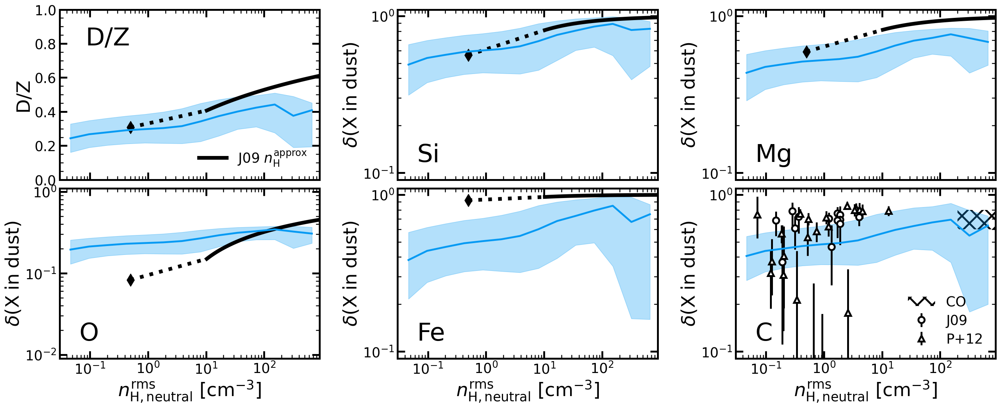

In [43]:


# Set if you want to plot elements in dust instead of elements missing from gas
element_in_dust = True
# Flag to account for clumping in nH and T
clumping_flag = True
# Include Jenkins 09 observations
include_observations = True

if element_in_dust: depl_str = 'dust_depletion'
else: depl_str = 'gas_depletion'
if clumping_flag: dens_str = 'rms_density'
else: dens_str = 'density'
foutname = 'DZ_' + depl_str + '_' + dens_str + '_trends.pdf'

elements= ['D/Z','Si','Mg','O','Fe','C']
if element_in_dust:
    depl_lims = [[0,1],[0.9E-1,1.1],[0.9E-1,1.1],[0.9E-2,1.1],[0.9E-1,1.1],[0.9E-1,1.1]]
else:
    depl_lims = [[0,1],[0.9E-2,1.1],[0.9E-1,1.1],[0.9E-2,1.1],[0.9E-1,1.1]]
num_elems = len(elements)



for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    gas = halo.loadpart(0)


    num_snaps = len(galaxies)
    colors = config.LINE_COLORS[:num_snaps]
    colors = config.LINE_COLORS[:num_snaps]
    linestyles = config.LINE_STYLES[:num_snaps]
    linewidth = 2*config.BASE_LINEWIDTH


    nH_prop = 'nH_neutral_rms' if clumping_flag else 'nH_neutral'
    depl_prop = 'dust_depletion' if element_in_dust else 'gas_depletion'

    fig = Figure(num_elems,ncols=3,sharex='col', yx_ratio=0.8)
    for j,elem in enumerate(elements): 
        if elem == 'D/Z': 
            fig.set_axis(j, nH_prop, elem, y_lim = depl_lims[j],y_log=False)
        else:
            fig.set_axis(j, nH_prop, depl_prop, y_lim = depl_lims[j])

        if include_observations:
            # Data is so scarce for C only plot the observed sightlines as a lower limit.
            if elem == 'C':
                J09_C_depl, J09_C_err, J09_C_density = obs.Jenkins_2009_Elem_Depl(elem,density='<nH>')      
                P12_C_depl, P12_C_err, P12_C_density = obs.Parvathi_2012_C_Depl(solar_abund='max', density='<nH>')
                # Used for expected C in CO hatched region
                CO_density = np.array([2E2,1E4])
                CO_depl_min = np.array([0.2,0.2])
                CO_depl_max = np.array([0.4,0.4])

                if element_in_dust:
                    J09_C_depl = 1-J09_C_depl
                    P12_C_depl = 1-P12_C_depl
                    CO_depl_min = 1-CO_depl_min
                    CO_depl_max = 1-CO_depl_max


                fig.plot_errorbar_data(j, J09_C_density, J09_C_depl, y_err = J09_C_err, c='xkcd:black',fmt='o',label='J09')    
                fig.plot_errorbar_data(j, P12_C_density, P12_C_depl, y_err = P12_C_err, c='xkcd:black',fmt='^',label='P+12')
                # Add in shaded region for 20-40% of C in CO bars
                fig.plot_shaded_region(j, CO_density,CO_depl_min, CO_depl_max, color="none", hatch="x", edgecolor="xkcd:black", lw=0,
							  label='CO', alpha=1)
            elif elem == 'D/Z':
                density_vals, DZ_vals = obs.Jenkins_2009_DZ_vs_dens(phys_dens=True, elem='Z')
                fig.plot_line_data(j, density_vals, DZ_vals, label=r'J09 $n_{\rm H}^{\rm approx}$', color='xkcd:black',linestyle='-',linewidth=linewidth)
                WNM_dens, WNM_DZ, WNM_error = obs.Jenkins_Savage_2009_WNM_Depl('Z')
                fig.plot_line_data(j, [WNM_dens,density_vals[0]], [WNM_DZ,DZ_vals[0]], color='xkcd:black',linestyle=':',linewidth=linewidth)
                fig.plot_scatter_data(j, [WNM_dens], [WNM_DZ], c='xkcd:black',marker='d',s=2*config.BASE_MARKERSIZE)
                fig.set_axis_legend(j)
 
            else:
                density_vals, dust_depl_vals = obs.Jenkins_2009_DZ_vs_dens(phys_dens=True, elem=elem)
                WNM_dens, WNM_depl, WNM_error = obs.Jenkins_Savage_2009_WNM_Depl(elem)

                if not element_in_dust:
                    dust_depl_vals = 1-dust_depl_vals
                    WNM_depl = 1-WNM_depl

                fig.plot_line_data(j, density_vals, dust_depl_vals, label=r'J09 $n_{\rm H}^{\rm approx}$', color='xkcd:black',linestyle='-',linewidth=linewidth)
                fig.plot_line_data(j, [WNM_dens,density_vals[0]], [WNM_depl,dust_depl_vals[0]], color='xkcd:black',linestyle=':',linewidth=linewidth)
                fig.plot_scatter_data(j, [WNM_dens], [WNM_depl], c='xkcd:black',marker='d',s=2*config.BASE_MARKERSIZE)
        
        if elem == 'D/Z':
                fig.add_text(j, 0.1, 0.9, elem, rescale_font=1,ha='left',va='top')
        else:
            if element_in_dust:
                #fig.add_text(j, 0.9, 0.3, elem, rescale_font=1,ha='right',va='bottom')
                fig.add_text(j, 0.075, 0.075, elem, rescale_font=1,ha='left',va='bottom')
            else:
                fig.add_text(j, 0.1, 0.1, elem, rescale_font=1,ha='left',va='bottom')

        bin_nums=15
        if elem == 'D/Z':
            depl_values = gas.get_property('D/Z')
        else:
            depl_values = (gas.get_property('dust_Z')/gas.get_property('Z_all')[:,:11])[:,config.ELEMENTS.index(elem)]
            if not element_in_dust:
                depl_values=1-depl_values

        bin_vals, mean_vals, std_vals = calc.calc_binned_property_vs_property(gas,depl_values, nH_prop, bin_nums=bin_nums)
        fig.plot_line_data(j,bin_vals,mean_vals, color=colors[0],linestyle=linestyles[0])
        fig.plot_shaded_region(j,bin_vals,std_vals[:,0],std_vals[:,1], color=colors[0])
       
    if element_in_dust: loc = 'lower right'
    else: loc = 'best'
    fig.set_all_legends(loc=loc)


    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)


#### Dust Process Information

##### Grain Velocities

Define the desired grain velocity equation below

In [58]:

vgrain_name = 'new_kol'
def v_grain(M,agrain,temp,nH,rho_c,T_eff):
    T_cutoff = 300
    # Kolmogorov
    v_grain = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(T_eff/100,0.25) * \
        np.power(nH/1E3,-0.25)*np.power(rho_c/3.5,0.5)
    # Supersonic
    # v_grain = 0.066*(M/3)*(agrain)*np.power(nH/1E3,-0.5)*np.power(rho_c/3.5,0.5)
    # In dense gas assume M=1
    v_grain[T_eff <= T_cutoff] /= M[T_eff <= T_cutoff] 
    return v_grain

def dense_enhancement(nH,T_eff):
        nH_min=0.1;nH_max=1E2 #cm^-3
        coag_dens_enhancement = 100

        T_cutoff = 300
        T_mask = T_eff<=T_cutoff
        enh_power=np.log10(coag_dens_enhancement)/np.log10(nH_max/nH_min)
        enh_factor = np.ones(len(nH))
        cut_mask = (nH > nH_min) & (nH <= nH_max) & (T_mask)
        enh_factor[cut_mask] = np.power(nH[cut_mask]/nH_min, enh_power)
        cut_mask = (nH > nH_max) & (T_mask)
        enh_factor[cut_mask] = coag_dens_enhancement
        return enh_factor

###### Grain Velocity Phase Diagram

/N/project/choban_group/cchoban/size_evo_suite/variations/new_fiducial/output


/tmp/ipykernel_438466/1571243066.py:10: RuntimeWarning: invalid value encountered in divide
  v_grain[T_eff <= T_cutoff] /= M[T_eff <= T_cutoff]


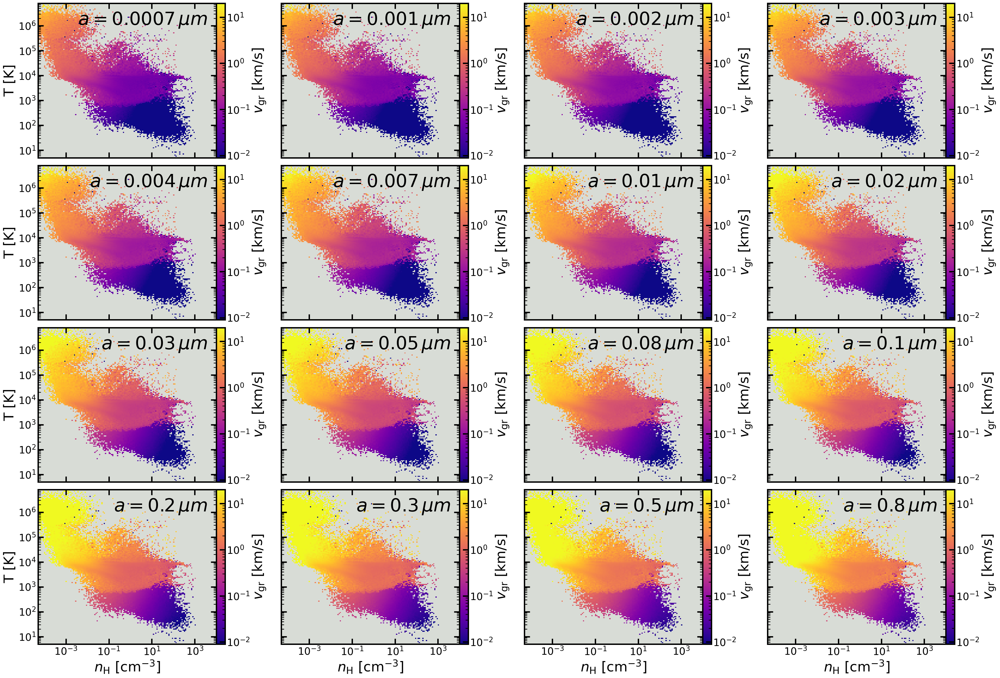

In [63]:
foutname = 'vgrain_phase_diagram.pdf'
props = ['v_grain']
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[9E-3,2E1]

# Do you want to factor in the clumping factor when calculating nH/T for the phase diagram?
clumping_flag = False

# Include the dense gas enhancement factor scheme
dense_gas_enhancement=True
species_name='silicates'

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    gas = halo.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    T_eff = gas.get_property('T_eff')
    T_eff  = temp / np.sqrt(1+np.square(0.5*M))
    nH_rms = gas.get_property('nH_rms')
 
    if dense_gas_enhancement:
        enh_factor = dense_enhancement(nH,T_eff)
        nH_rms *= enh_factor

    spec_props = config.dust_species_properties(species_name)
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = sp.Flag_GrainSizeBins
    a_centers = sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = v_grain(M,agrain,temp,nH_rms,rho_c,T_eff)

        if not clumping_flag:
            fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        else:
            fig.set_axis(j, 'nH_rms', 'T_eff', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median',factor_clumping=clumping_flag)

        v_gr_binned = ret.statistic.T
        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'v_grain', X, Y, v_gr_binned, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.1g\,\mu m$'%agrain)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    extra_name = ''
    if clumping_flag:
        extra_name += '_clumping'
    if dense_gas_enhancement:
        extra_name += '_enhanced'
    else:
        extra_name += '_noenhanced'

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+extra_name+'_'+species_name+'_'+vgrain_name+'_'+foutname)

###### Thermal Sound Speed Phase Diagram

/N/project/choban_group/cchoban/size_evo_suite/variations/fiducial/output


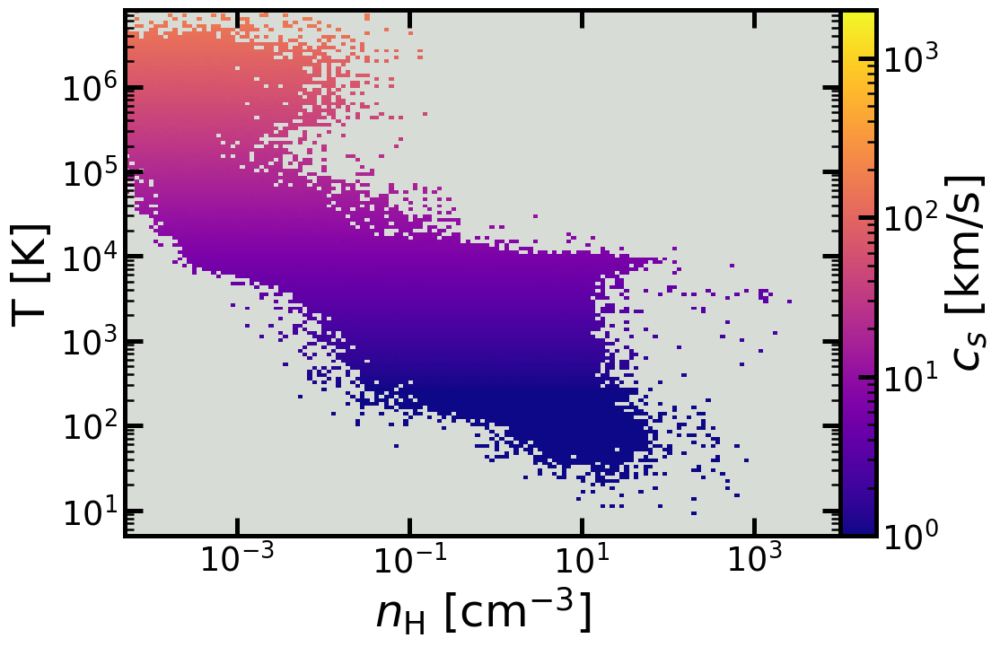

In [277]:
foutname = 'sound_speed_phase_diagram.pdf'
props = ['v_grain']
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E0,2E3]

# Do you want to factor in the clumping factor when calculating nH/T for the phase diagram?
clumping_flag = False

# Include the dense gas enhancement factor scheme
dense_gas_enhancement=True

for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    gas = halo.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    T_eff = gas.get_property('T_eff')
    nH_rms = gas.get_property('nH_rms')

    fig = Figure(1)


    sound_speed = 0.111*np.sqrt(temp)/np.sqrt(3) # km/s

    if not clumping_flag:
        fig.set_axis(0, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    else:
        fig.set_axis(0, 'nH_rms', 'T_eff', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

    
    ret = calc.calc_phase_hist_data(sound_speed, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median',factor_clumping=clumping_flag)

    cs_binned = ret.statistic.T
    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(0, 'sound_speed', X, Y, cs_binned, cmap=cmap, z_lim=prop_lim, z_log=z_log)

    # Add colorbar to last axis
    fig.add_colorbar(0,cbar_label=r'$c_s$ [km/s]')
    
    extra_name = ''
    if clumping_flag:
        extra_name += '_clumping'
    if dense_gas_enhancement:
        extra_name += '_enhanced'
    else:
        extra_name += '_noenhanced'

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+extra_name+'_'+foutname)

###### Grains with velocities below coagulation threshold

/N/project/choban_group/cchoban/size_evo_suite/variations/new_fiducial/output


/tmp/ipykernel_438466/1571243066.py:10: RuntimeWarning: invalid value encountered in divide
  v_grain[T_eff <= T_cutoff] /= M[T_eff <= T_cutoff]


a_grain: 0.00065 v_coag: 0.21 fraction of gas < v_coag: 0.032
a_grain: 0.001 v_coag: 0.14 fraction of gas < v_coag: 0.032
a_grain: 0.0017 v_coag: 0.095 fraction of gas < v_coag: 0.032
a_grain: 0.0027 v_coag: 0.064 fraction of gas < v_coag: 0.032
a_grain: 0.0044 v_coag: 0.043 fraction of gas < v_coag: 0.029
a_grain: 0.007 v_coag: 0.029 fraction of gas < v_coag: 0.024
a_grain: 0.011 v_coag: 0.019 fraction of gas < v_coag: 0.014
a_grain: 0.018 v_coag: 0.013 fraction of gas < v_coag: 0.0075
a_grain: 0.029 v_coag: 0.0088 fraction of gas < v_coag: 0.0031
a_grain: 0.047 v_coag: 0.0059 fraction of gas < v_coag: 0.00056
a_grain: 0.075 v_coag: 0.004 fraction of gas < v_coag: 2.2e-05
a_grain: 0.12 v_coag: 0.0027 fraction of gas < v_coag:  0
a_grain: 0.2 v_coag: 0.0018 fraction of gas < v_coag:  0
a_grain: 0.31 v_coag: 0.0012 fraction of gas < v_coag:  0
a_grain: 0.5 v_coag: 0.00082 fraction of gas < v_coag:  0
a_grain: 0.81 v_coag: 0.00055 fraction of gas < v_coag:  0


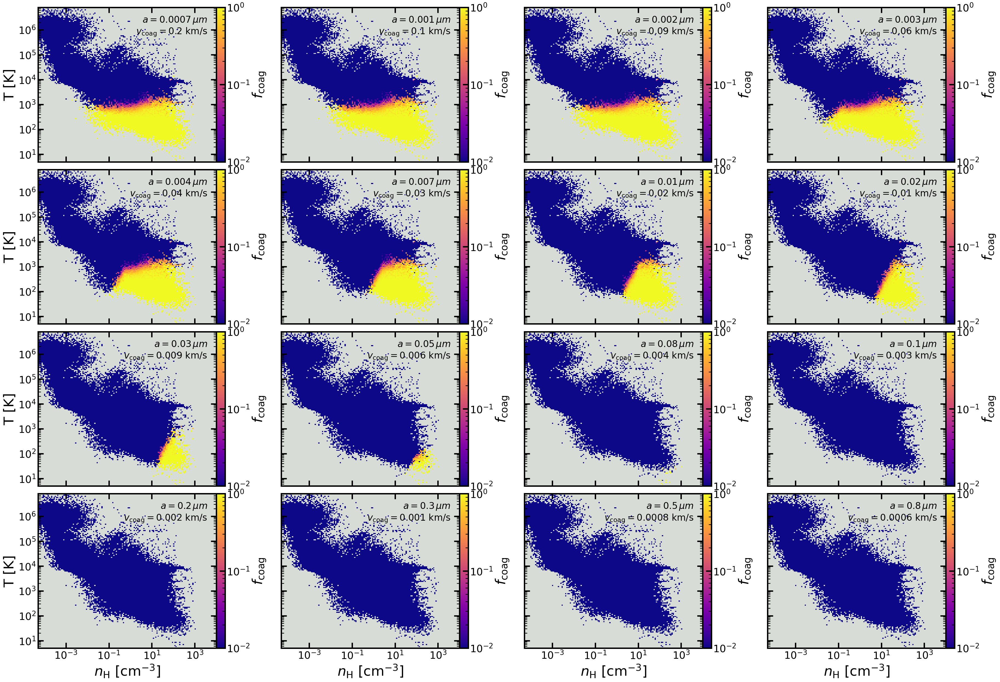

In [64]:
foutname = 'vcoag_phase_diagram.pdf'
prop = 'fraction'
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E-2,1E1]

clumping_flag=False
dense_gas_enhancement=True
v_coag_factor = 1
v_grain_factor = 1


for i,halo in enumerate(galaxies):
    print(halo.sp.sdir)
    name = sim_names[i]

    gas = halo.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    T_eff = gas.get_property('T_eff')
    T_eff  = temp / np.sqrt(1+np.square(0.5*M))
    nH_rms = gas.get_property('nH_rms')

    T_cutoff=300
    T_mask = T_eff<=T_cutoff
    if dense_gas_enhancement:
        enh_factor = dense_enhancement(nH,T_eff)
        nH_rms *= enh_factor

    spec_props = config.dust_species_properties(species_name)
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = halo.sp.Flag_GrainSizeBins
    a_centers = halo.sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = v_grain(M,agrain,temp,nH_rms,rho_c, T_eff) # km/s


        vgr[T_mask] *= v_grain_factor

        vcoag = v_coag_factor * gse_models.v_coagulation(agrain*config.um_to_cm,a_collider*config.um_to_cm,
                        rho_c,poisson,youngs,gamma,fudge_factor=True) * 1E-5 # cm/s to km/s
        

        if vcoag>v_shat: vcoag=v_shat

        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        M_gas = gas.get_property('mass')
        M_coag = np.copy(M_gas)
        M_coag[(vgr>vcoag) | (T_eff>T_cutoff)]=0
        M_coag[M==0]=0

        mass_total = calc.calc_phase_hist_data(M_gas, halo, bin_nums=bin_nums, 
                        nH_lims=nH_lims, T_lims=T_lims, bin_func='sum',
                        factor_clumping=clumping_flag).statistic.T
        mass_coag = calc.calc_phase_hist_data(M_coag, halo, bin_nums=bin_nums, 
                        nH_lims=nH_lims, T_lims=T_lims, bin_func='sum',
                        factor_clumping=clumping_flag).statistic.T
        frac_coag = mass_coag/mass_total


        print('a_grain: %2.2g'%agrain,'v_coag: %2.2g'%vcoag,'fraction of gas < v_coag: %2.2g'%(np.nansum(mass_coag)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, frac_coag, cmap=cmap, z_lim=[0.01,1], z_log=True,label=r'$a=%1.1g\,\mu m$'%agrain+'\n'+r'$v_{\rm coag}=%2.1g$ km/s'%vcoag, rescale_font=0.5)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$f_{\rm coag}$')

    extra_name = "_%ixVcoag"%v_coag_factor+"_%1.1fxVgrain"%v_grain_factor
    if clumping_flag:
        extra_name += '_clumping'

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+extra_name+'_'+species_name+'_'+vgrain_name+'_'+foutname)

###### Grains with velocity above shattering threshold

/N/project/choban_group/cchoban/size_evo_suite/variations/new_fiducial/output


/tmp/ipykernel_438466/1571243066.py:10: RuntimeWarning: invalid value encountered in divide
  v_grain[T_eff <= T_cutoff] /= M[T_eff <= T_cutoff]


a_grain: 0.00065 v_shat: 2.2 fraction of gas > v_shat: 0.0089
a_grain: 0.001 v_shat: 2.2 fraction of gas > v_shat: 0.011
a_grain: 0.0017 v_shat: 2.2 fraction of gas > v_shat: 0.015
a_grain: 0.0027 v_shat: 2.2 fraction of gas > v_shat: 0.02
a_grain: 0.0044 v_shat: 2.2 fraction of gas > v_shat: 0.027
a_grain: 0.007 v_shat: 2.2 fraction of gas > v_shat: 0.036
a_grain: 0.011 v_shat: 2.2 fraction of gas > v_shat: 0.047
a_grain: 0.018 v_shat: 2.2 fraction of gas > v_shat: 0.062
a_grain: 0.029 v_shat: 2.2 fraction of gas > v_shat: 0.084
a_grain: 0.047 v_shat: 2.2 fraction of gas > v_shat: 0.12
a_grain: 0.075 v_shat: 2.2 fraction of gas > v_shat: 0.17
a_grain: 0.12 v_shat: 2.2 fraction of gas > v_shat: 0.26
a_grain: 0.2 v_shat: 2.2 fraction of gas > v_shat: 0.39
a_grain: 0.31 v_shat: 2.2 fraction of gas > v_shat: 0.53
a_grain: 0.5 v_shat: 2.2 fraction of gas > v_shat: 0.66
a_grain: 0.81 v_shat: 2.2 fraction of gas > v_shat: 0.76


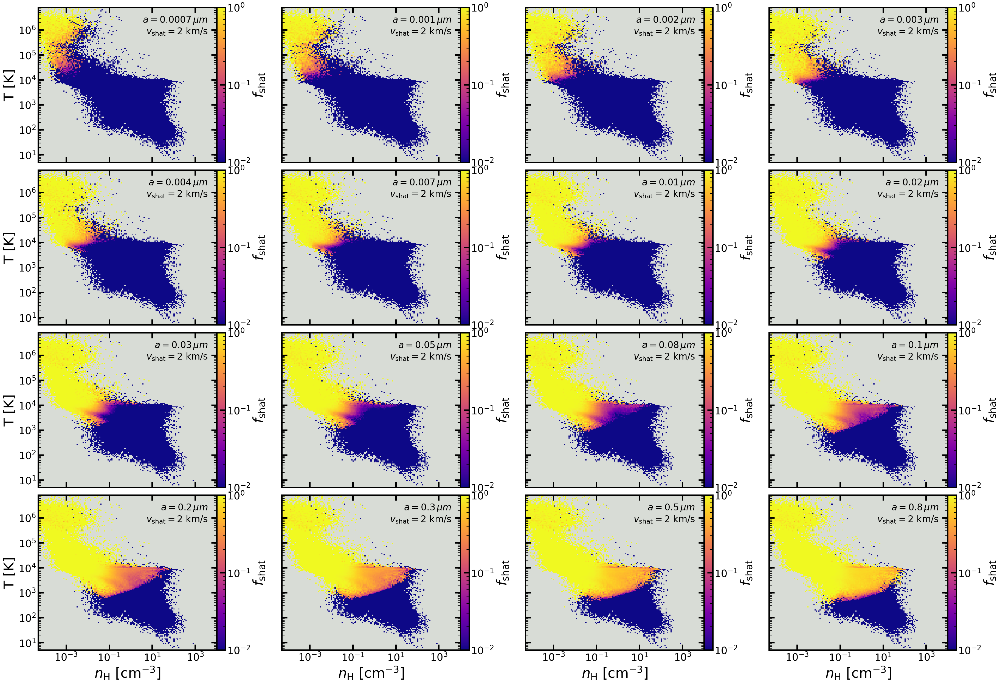

In [52]:
foutname = 'vshat_phase_diagram.pdf'
prop = 'fraction'
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E-2,1E1]

clumping_flag=False
dense_gas_enhancement=True
v_coag_factor = 1
v_grain_factor = 1


for i,halo in enumerate(galaxies):
    print(halo.sp.sdir)
    name = sim_names[i]

    gas = halo.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    T_eff = gas.get_property('T_eff')
    nH_rms = gas.get_property('nH_rms')


    T_mask = T_eff<=300
    if dense_gas_enhancement:
        enh_factor = dense_enhancement(nH,T_eff)
        nH_rms *= enh_factor

    spec_props = config.dust_species_properties(species_name)
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = halo.sp.Flag_GrainSizeBins
    a_centers = halo.sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = v_grain(M,agrain,temp,nH_rms,rho_c,T_eff) # km/s


        vgr[T_mask] *= v_grain_factor

        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        M_gas = gas.get_property('mass')
        M_shat = np.copy(M_gas)
        M_shat[vgr<v_shat]=0
        M_shat[M==0]=0

        mass_total = calc.calc_phase_hist_data(M_gas, halo, bin_nums=bin_nums, 
                        nH_lims=nH_lims, T_lims=T_lims, bin_func='sum',
                        factor_clumping=clumping_flag).statistic.T
        mass_shat = calc.calc_phase_hist_data(M_shat, halo, bin_nums=bin_nums, 
                        nH_lims=nH_lims, T_lims=T_lims, bin_func='sum',
                        factor_clumping=clumping_flag).statistic.T
        frac_shat = mass_shat/mass_total


        print('a_grain: %2.2g'%agrain,'v_shat: %2.2g'%v_shat,'fraction of gas > v_shat: %2.2g'%(np.nansum(mass_shat)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, frac_shat, cmap=cmap, z_lim=[0.01,1], z_log=True,label=r'$a=%1.1g\,\mu m$'%agrain+'\n'+r'$v_{\rm shat}=%2.1g$ km/s'%v_shat, rescale_font=0.5)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$f_{\rm shat}$')

    extra_name = "_%ixVcoag"%v_coag_factor+"_%1.1fxVgrain"%v_grain_factor
    if clumping_flag:
        extra_name += '_clumping'

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+extra_name+'_'+species_name+'_'+vgrain_name+'_'+foutname)

##### Accretion Rate Phase Diagram

/N/project/choban_group/cchoban/size_evo_suite/fiducial/output
$T_{\rm cut}<300$ K
dMdt_acc: 0.030264144601801664 Msol/yr
$T_{\rm cut}<100$ K
dMdt_acc: 0.016799980186176303 Msol/yr
$T_{\rm cut}<1000$ K
dMdt_acc: 0.05456814544172505 Msol/yr
no Coulomb
dMdt_acc: 0.03212636662051263 Msol/yr
no clumping
dMdt_acc: 0.008038119562066482 Msol/yr


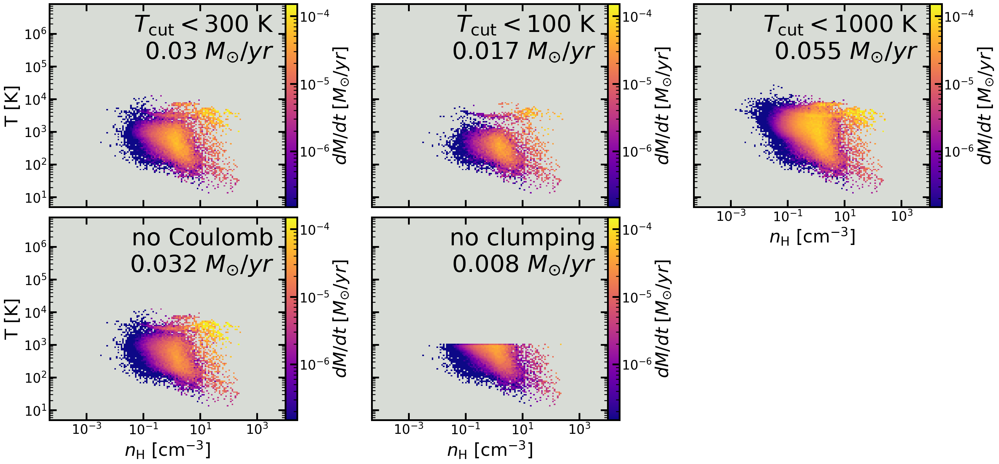

In [152]:
foutname = 'dMdt_accretion_phase_diagram.pdf'

fig_labels = [r'$T_{\rm cut}<300$ K',r'$T_{\rm cut}<100$ K',r'$T_{\rm cut}<1000$ K','no Coulomb','no clumping']
T_cutoffs = [300,100,1000,300,1000]
Coulomb_flags = [True,True,True,False,True]
clumping_flags = [True,True,True,True,False]
# Set flag to ignore tracked grain size distribution and assume MRN with the same total dust mass
assume_MRN_flag = False

props = ['dMdt_acc']*len(fig_labels)
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lims=[[1.5E-7,1.5E-4]]*len(props)

# Number of subsampling for each bin when calculating dMdt rates.
# N=1 will assume all grains have the same size in each bin
# Set to a small number to get a good estimate
bin_subsamples = 4



for i,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    G = halo.loadpart(0)

    fig = Figure(len(props),ncols=3, sharex='col',sharey='row')

    for j,prop in enumerate(props):

        dMdt_acc = grain_size_utils.get_dust_accretion_rate(G, 
                                                            T_cutoff=T_cutoffs[j], 
                                                            factor_clumping=clumping_flags[j],
                                                            bin_subsamples=bin_subsamples,
                                                            Coulomb_factor=Coulomb_flags[j],
                                                            assume_MRN_dust=assume_MRN_flag)
        print(fig_labels[j])
        total_dMdt = np.sum(dMdt_acc)
        print('dMdt_acc:',total_dMdt,'Msol/yr')

    
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(dMdt_acc, halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j]+'\n %0.2g '%total_dMdt + r'$M_{\odot}/yr$')

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

In [ ]:
foutname = 'Mshatcoag_phase_diagram.pdf'
props = ['dM_coag','dM_shat']
fig_labels = ['shattering','coagulation']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lims=[[1E-7,1E-4]]*len(props)

a_small = 0.01 

for i,sp in enumerate(snaps):
    if i!=0: continue
    print(sp.sdir)
    name = sim_names[i]

    G = sp.loadpart(0)
    a_centers = sp.Grain_Bin_Centers
    total_dust_mass = np.sum(G.get_property('M_dust'))
    # Determine how much dust mass is can shatter or coagulate for each gas particle
    
    shat_dMbin_dt, coag_dMbin_dt = grain_size_utils.get_dust_shattering_and_coagulation_rate(
                             G, 
                             scaling_factor=1.0,
                             factor_clumping=True,)

    dMdt = [shat_dMbin_dt, coag_dMbin_dt]

    print(np.sum(shat_dMbin_dt,axis=1), np.sum(coag_dMbin_dt,axis=1))

    fig = Figure(len(props),ncols=2, sharex='col',sharey='row')

    j=0
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

    dMbin_dt = dMdt[j]
    dMbin_total = np.sum(dMbin_dt[:,a_centers<a_small],axis=1)

    ret = calc.calc_phase_hist_data(dMbin_total, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

    ret.statistic[ret.statistic == 0] = np.nan

    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop='dMdt')


    j=1
    fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

    dMbin_dt = dMdt[j]
    dMbin_total = np.sum(dMbin_dt[:,a_centers<a_small],axis=1)

    ret = calc.calc_phase_hist_data(dMbin_total, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')
    ret.statistic = np.abs(ret.statistic)  
    ret.statistic[ret.statistic == 0] = np.nan

    X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

    # Add colorbar to last axis
    fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)


##### Shattering and Coagulation Mass Rates for each Bin

In [46]:
foutname = 'Mshatcoag_phase_diagram.pdf'
props = ['M_dust','M_dust']
fig_labels = ['shattering','coagulation']
z_logs=[True]*len(props)
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lims=[[1E2,1E6]]*len(props)



for i,halo in enumerate(halos):
    sp=halo.sp
    print(sp.sdir)
    name = sim_names[i]

    G = halo.loadpart(0)
    total_dust_mass = np.sum(G.get_property('M_dust'))
    # Determine how much dust mass is can shatter or coagulate for each gas particle
    
    Mshat, Mcoag = grain_size_utils.get_mass_of_dust_that_can_shatter_or_coagulate(G)
    Mdust = [Mshat, Mcoag]
    print(Mshat/total_dust_mass,Mcoag/total_dust_mass)

    fig = Figure(len(props),ncols=2, sharex='col',sharey='row')

    for j,prop in enumerate(props):
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(Mdust[j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, ret.statistic.T, cmap=cmap, z_lim=prop_lims[j], z_log=z_logs[j],label=fig_labels[j])

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='M_dust')

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output


KeyboardInterrupt: 

In [ ]:
foutname = 'Kolmogorov_vgrain_phase_diagram.pdf'
props = ['v_grain']
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E-2,1E1]

dense_gas_enhancement=True

for i,sp in enumerate(snaps):
    print(sp.sdir)
    name = sim_names[i]

    gas = sp.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    
    rho_c = 3.1
    b = 0.5
    nH_rms =np.sqrt(1+b*b*M*M)*nH
    if dense_gas_enhancement:
        nH_rms[(temp<=1000) & (nH >= 1)] *= 1000

    spec_props = config.dust_species_properties('silicates')
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = sp.Flag_GrainSizeBins
    a_centers = sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(temp/100,0.25) * \
        np.power(nH_rms/1E3,-0.25)*np.power(rho_c/3.5,0.5) # km/s

        vcoag = gse_models.v_coagulation(agrain*config.um_to_cm,a_collider*config.um_to_cm,
                        rho_c,poisson,youngs,gamma,fudge_factor=True) * 1E-5 # cm/s to km/s

        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')

        M_gas = gas.get_property('mass')
        M_gas[vgr>vcoag] = 0
        mass_coag = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic
        
        vgr_coag = ret.statistic.T
        vgr_coag[vgr_coag>vcoag] = np.nan
        print('a_grain: %2.2g'%agrain,'v_coag: %2.2g'%vcoag,'fraction of gas < v_coag: %2.2g'%(np.nansum(mass_coag)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, vgr_coag, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.1g\,\mu m$'%agrain+'\n'+r'$v_{\rm coag}=%2.1g$ km/s'%vcoag)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_vcoag_'+foutname)


    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        vgr = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(temp/100,0.25) * \
        np.power(nH_rms/1E3,-0.25)*np.power(rho_c/3.5,0.5) # km/s
        
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')
        
        M_gas = gas.get_property('mass')
        M_gas[vgr<v_shat] = 0
        mass_shat = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic

        vgr_shat = ret.statistic.T
        vgr_shat[vgr_shat<v_shat] = np.nan
        print('a_grain: %2.2g'%agrain,'v_shat: %2.2g'%v_shat,'fraction of gas > v_shat: %2.2g'%(np.nansum(mass_shat)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, vgr_shat, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.1g\,\mu m$'%agrain+'\n'+r'$v_{\rm shat}=%2.1g$ km/s'%v_shat)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_vshat_'+foutname)
        

In [ ]:
foutname = 'supersonic_vgrain_phase_diagram.pdf'
props = ['v_grain']
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


prop_lim=[1E-2,1E1]

dense_gas_enhancement=1
vcoag_enhancenent = 100

for i,sp in enumerate(snaps):
    print(sp.sdir)
    name = sim_names[i]

    gas = sp.loadpart(0)
    nH = gas.get_property('nH')
    rho = gas.get_property('density')
    temp = gas.get_property('temperature')
    M = gas.get_property('mach_number')
    
    b = 0.5
    nH_rms =np.sqrt(1+b*b*M*M)*nH
    if dense_gas_enhancement:
        nH_rms[(temp<=1000) & (nH >= 1)] *= dense_gas_enhancement

    spec_props = config.dust_species_properties('silicates')
    rho_c = spec_props['rho_c'] # Bulk density of silicates [g/cm^3]
    poisson = spec_props['poisson'] # Poisson ratio
    youngs = spec_props['youngs'] # Young's modulus [GPa]
    gamma = spec_props['gamma'] # Surface energy [J/m^2]
    v_shat = spec_props['v_shat']*1E-5 # Shattering velocity [km/s]

    bin_num = sp.Flag_GrainSizeBins
    a_centers = sp.Grain_Bin_Centers

    fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')
 

    for j in range(bin_num):
        agrain = a_centers[j]
        a_collider=agrain
        # Grain velocity assuming supersonic turbulence
        vgr = 0.066 * (M/3) * (agrain) * \
        np.power(nH_rms/1E3,-0.5)*(rho_c/3.5) # km/s

        vcoag = gse_models.v_coagulation(agrain*config.um_to_cm,a_collider*config.um_to_cm,
                        rho_c,poisson,youngs,gamma,fudge_factor=True) * 1E-5 # cm/s to km/s
        
        vcoag *= vcoag_enhancenent
        if vcoag>v_shat: vcoag = v_shat
        
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
        ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')

        M_gas = gas.get_property('mass')
        M_gas[vgr>vcoag] = 0
        mass_coag = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic
        
        vgr_coag = ret.statistic.T
        vgr_coag[vgr_coag>vcoag] = np.nan
        print('a_grain: %2.2g'%agrain,'v_coag: %2.2g'%vcoag,'fraction of gas < v_coag: %2.2g'%(np.nansum(mass_coag)/np.sum(gas.get_property('mass'))))


        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, prop, X, Y, vgr_coag, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%agrain+'\n'+r'$v_{\rm coag}=%2.1g$ km/s'%vcoag)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    fig.save(plot_dir+name+'_'+str(sp.snum)+'_vcoag_'+foutname)


    # fig = Figure(bin_num,ncols=4, sharex='col',sharey='row')
 

    # for j in range(bin_num):
    #     agrain = a_centers[j]
    #     a_collider=agrain
    #     vgr = 0.066 * (M/3) * (agrain) * \
    #     np.power(nH_rms/1E3,-0.5)*(rho_c/3.5) # km/s
        
    #     fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')
    #     ret = calc.calc_phase_hist_data(vgr, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='median')
        
    #     M_gas = gas.get_property('mass')
    #     M_gas[vgr<v_shat] = 0
    #     mass_shat = calc.calc_phase_hist_data(M_gas, sp, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum').statistic

    #     vgr_shat = ret.statistic.T
    #     vgr_shat[vgr_shat<v_shat] = np.nan
    #     print('a_grain: %2.2g'%agrain,'v_shat: %2.2g'%v_shat,'fraction of gas > v_shat: %2.2g'%(np.nansum(mass_shat)/np.sum(gas.get_property('mass'))))


    #     X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
    #     fig.plot_2Dhistogram(j, prop, X, Y, vgr_shat, cmap=cmap, z_lim=prop_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%agrain+'\n'+r'$v_{\rm shat}=%2.2g$ km/s'%v_shat)

    #     # Add colorbar to last axis
    #     fig.add_colorbar(j,cbar_label=r'$v_{\rm gr}$ [km/s]')
    
    # fig.save(plot_dir+name+'_'+str(sp.snum)+'_vshat_'+foutname)

In [ ]:
M = 1; 
agrain = 0.01 # micron
rho_c = 3.1 # g/cm^3
nH_rms = 1E0 # cm^-3
temp = 1000
N=100000 # number of samples

fig = Figure(2,sharey='row')

# Grain velocity with Kolmogorov or supersonic power spectrum
vgr_K = 0.32 * (M/3) * np.power(agrain,0.5) * np.power(temp/100,0.25) * \
        np.power(nH_rms/1E3,-0.25)*np.power(rho_c/3.5,0.5) # km/s


v12rel_Kolmogorov = np.zeros(N)
vgr1=vgr_K; vgr2=vgr_K;
for i in range(N):
    cos_imp_angle = 2*(np.random.rand()-0.5)
    v12rel_Kolmogorov[i] = np.sqrt(vgr1*vgr1 + vgr2*vgr2 - 2*vgr1*vgr2*cos_imp_angle) # km/s



y_lims = [0,1]
x_lims = [-0.1*vgr1,3*vgr1]
fig.set_axis(0, 'v_rel', 'PDF', x_lim=x_lims, x_log=False, y_lim=y_lims, y_log=False,x_label = r'$v_{\rm gr,rel}$ [km/s]', y_label = 'Number')
fig.axes[0].vlines(vgr_K, 0, 1, color='xkcd:black', linestyle='--')

fig.plot_1Dhistogram(0, v12rel_Kolmogorov, bin_nums=20, color='xkcd:blue', label='Angle', density=True, cumulative=True)


v12rel_Kolmogorov = np.zeros(N)
vgr1=vgr_K; vgr2=vgr_K;
sigma1 = vgr1/np.sqrt(3)
sigma2 = vgr2/np.sqrt(3)
print(sigma1, vgr1)
for i in range(N):
    v1_vec = np.random.normal(0, sigma1,3)
    v2_vec = np.random.normal(0, sigma2,3)
    v12rel_Kolmogorov[i] = np.linalg.norm(v1_vec - v2_vec)

fig.plot_1Dhistogram(0, v12rel_Kolmogorov, bin_nums=20, color='xkcd:red', label='Gaussian', density=True, cumulative=True)


fig.add_text(0,0.05,0.95,'Kolmogorov',ha='left',va='top',)


# Supersonic

vgr_S = 0.066 * (M/3) * (agrain) * \
        np.power(nH_rms/1E3,-0.5)*(rho_c/3.5) # km/s

v12rel_Supersonic = np.zeros(N)
vgr1=vgr_S; vgr2=vgr_S;
for i in range(N):
    cos_imp_angle = 2*(np.random.rand()-0.5)
    v12rel_Supersonic[i] = np.sqrt(vgr1*vgr1 + vgr2*vgr2 - 2*vgr1*vgr2*cos_imp_angle) # km/s


y_lims = [0,1]
x_lims = [-0.1*vgr1,3*vgr1]
fig.set_axis(1, 'v_rel', 'PDF', x_lim=x_lims, x_log=False, y_lim=y_lims, y_log=False,x_label = r'$v_{\rm gr,rel}$ [km/s]', y_label = 'Number')
fig.axes[1].vlines(vgr_S, 0, 1, color='xkcd:black', linestyle='--')

fig.plot_1Dhistogram(1, v12rel_Supersonic, bin_nums=20, color='xkcd:blue', label='Angle', density=True, cumulative=True)



v12rel_Supersonic = np.zeros(N)
vgr1=vgr_S; vgr2=vgr_S;
sigma1 = vgr1/np.sqrt(3)
sigma2 = vgr2/np.sqrt(3)
for i in range(N):
    v1_vec = np.random.normal(0, sigma1,3)
    v2_vec = np.random.normal(0, sigma2,3)
    v12rel_Supersonic[i] = np.linalg.norm(v1_vec - v2_vec)

fig.plot_1Dhistogram(1, v12rel_Supersonic, bin_nums=20, color='xkcd:red', label='Gaussian', density=True, cumulative=True)


fig.add_text(1,0.05,0.95,'Supersonic',ha='left',va='top',)


fig.set_all_legends(loc='lower right')

#### Grain size distributions for each ISM phase

##### Median distribution for each dust species

/N/project/choban_group/cchoban/gizmo_test/restart2/output
Snapshot time: 0.9000000000000006
Total dust mass sources: [5.6747305e+06 1.3765752e+03 1.7322758e+06 8.0138102e+04]
ISM phase: all
['silicates'] silicates 0
['carbonaceous'] carbonaceous 1
['iron'] iron 2
['silicates', 'carbonaceous', 'iron'] silicates 0
['silicates', 'carbonaceous', 'iron'] carbonaceous 1
['silicates', 'carbonaceous', 'iron'] iron 2


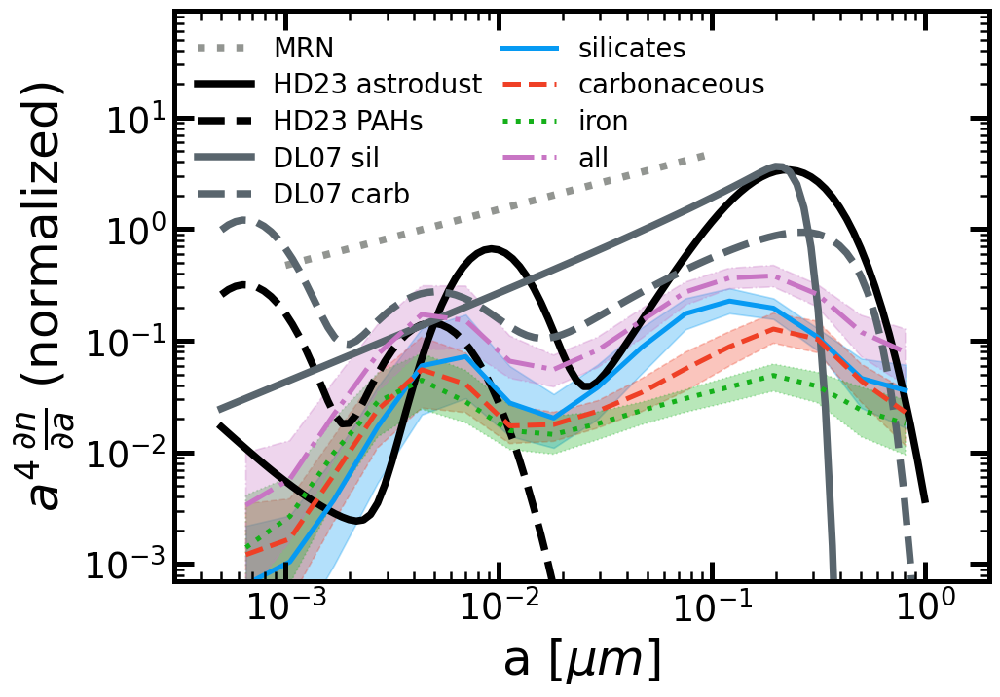

In [53]:

foutname = 'dmdloga_all_gas.pdf'


species=['silicates','carbonaceous','iron', 'all']
#species=['silicates','carbonaceous', 'all']
ISM_phases = ['all']

include_idealized_MRN=True
include_idealized_astrodust=True
include_idealized_DraineLi=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1




for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(1)
    num_specs = len(species)
    num_phases = len(ISM_phases)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH
    fig.set_axis(0, 'grain_size', 'dm/dloga_norm', y_lim=[7E-4,9E1])

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))

    for i,phase in enumerate(ISM_phases):
        if i==0:
            obs_linewidth = 1.5*config.BASE_LINEWIDTH
            obs_alpha = 1
            if include_idealized_MRN:
                y_offset = 1
                MRN_a_vals = np.logspace(-3,-1,10)
                dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
                dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
                fig.plot_line_data(0,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle=':', linewidth=obs_linewidth,
                                   label='MRN', alpha = obs_alpha)
                # x_coord = MRN_a_vals[len(MRN_a_vals)//4]
                # y_coord = 1.1*dmdloga_vals[len(MRN_a_vals)//2]
                # fig.add_text(0,x_coord,y_coord,r'$\frac{\partial n}{\partial a}\propto a^{-3.5}$',
                #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')
            if include_idealized_astrodust:
                idealized_bins = 100
                amin = 5E-4; amax = 1
                astrodust_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
                # Normalize astrodust+PAHs
                dmdloga_norm = quad(grain_size_utils.astrodust_dmdloga, amin, amax)[0] + quad(grain_size_utils.astrodust_dmdloga, amin, amax, args=(True))[0]

                # astrodust
                dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=False)/dmdloga_norm
                
                fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='-', linewidth=obs_linewidth,
                                   label='HD23 astrodust', alpha = obs_alpha)
                # PAHs
                dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=True)/dmdloga_norm
                
                fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='--', linewidth=obs_linewidth,
                                   label='HD23 PAHs', alpha = obs_alpha)

                # x_coord = astrodust_a_vals[len(astrodust_a_vals)//4]
                # y_coord = dmdloga_vals[len(astrodust_a_vals)//2]
                # fig.add_text(0,x_coord,y_coord,r'astrodust',
                #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')    

            if include_idealized_DraineLi:
                idealized_bins = 100
                amin = 5E-4; amax = 1
                DL_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
                # Normalize astrodust+PAHs
                dmdloga_norm = quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("silicates"))[0] + quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("carbonaceous"))[0]

                # silicates
                dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='silicates')/dmdloga_norm
                
                fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='-', linewidth=obs_linewidth,
                                   label='DL07 sil', alpha = obs_alpha)
                # carbonaceous
                dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='carbonaceous')/dmdloga_norm
                
                fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='--', linewidth=obs_linewidth,
                                   label='DL07 carb', alpha = obs_alpha)                



            # for j, spec in enumerate(species):
            #     # Lines used for the legend handles. Should not show up in plot
            #     fig.plot_line_data(0,[-1,-1],[-1,-1], color='xkcd:black',linestyle=linestyles[j],label=spec)
        
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        print("ISM phase:",phase)
        

        for j, spec in enumerate(species):
            grain_size_vals, percentile_dnda, percentile_dmdloga = \
                grain_size_utils.get_grain_size_distribution(G,  
                                                             dust_species=spec, 
                                                             mask=mask, 
                                                             points_per_bin=points_per_bin, 
                                                             std_percentiles = [16, 84])

            fig.plot_line_data(0,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec)
            fig.plot_shaded_region(0,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

##### Median distribution for each gas phase

/N/project/choban_group/cchoban/gizmo_test/restart_IC/output
Snapshot time: 0.5400000000000003
Total dust mass sources: [ 1621554.6          0.    16328936.       28804.016]
ISM phase: cold
gas mass 0.0227187936 Msol
silicates 0
(846107, 2, 16)
(846107, 2, 16)
carbonaceous 1
(846107, 2, 16)
(846107, 2, 16)
ISM phase: cool
gas mass 0.0400767584 Msol
silicates 0
(846107, 2, 16)
(846107, 2, 16)
carbonaceous 1
(846107, 2, 16)
(846107, 2, 16)
ISM phase: warm
gas mass 0.5141771776 Msol
silicates 0
(846107, 2, 16)
(846107, 2, 16)
carbonaceous 1
(846107, 2, 16)
(846107, 2, 16)
ISM phase: hot
gas mass 0.0252062448 Msol
silicates 0
(846107, 2, 16)
(846107, 2, 16)
carbonaceous 1
(846107, 2, 16)
(846107, 2, 16)


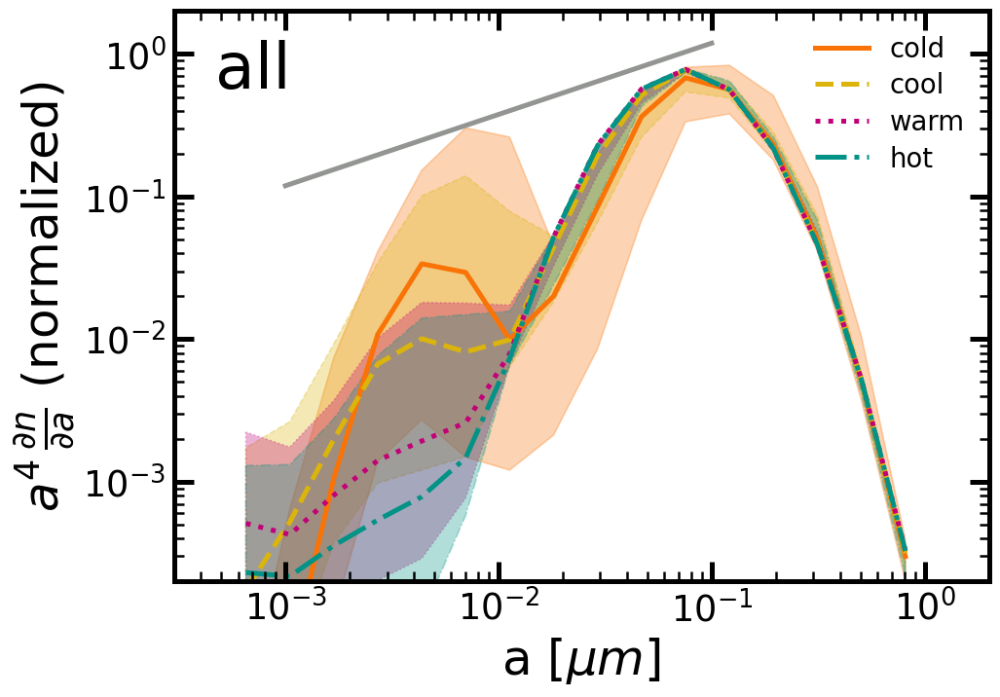

In [20]:

foutname = 'all_grain_dmdloga_ISM_phases.pdf'


species=['all']
ISM_phases = ['cold','cool','warm','hot']
factor_clumping=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1




for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)
    num_specs = len(species)
    num_phases = len(ISM_phases)


    fig = Figure(num_specs,ncols=2, sharex='col',sharey='row')

    colors = config.LINE_COLORS[:num_phases]
    colors = config.MARKER_COLORS[:num_phases]
    linestyles = config.LINE_STYLES[:num_phases]
    linewidth = 2*config.BASE_LINEWIDTH

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    for i, spec in enumerate(species):
        fig.set_axis(i, 'grain_size', 'dm/dloga_norm',y_lim=[2E-4,2E-0])

        if i==0:
            y_offset = 0.4
            MRN_a_vals = np.logspace(-3,-1,10)
            dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
            dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
            fig.plot_line_data(i,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle='-')
            # for j, spec in enumerate(species):
            #     # Lines used for the legend handles. Should not show up in plot
            #     fig.plot_line_data(0,[-1,-1],[-1,-1], color='xkcd:black',linestyle=linestyles[j],label=spec)
        
 
        for j, phase in enumerate(ISM_phases):
            
            #mask = calc.get_particle_mask(0, halo, mask_criteria=phase,factor_clumping=factor_clumping)

            if not factor_clumping:
                nH = G.get_property('nH')
                T = G.get_property('T')
            else:
                nH = G.get_property('nH_rms')
                T = G.get_property('T_eff')

            if 'cold' in phase:
                mask = (T < 100)
            if 'cool' in phase:
                mask = (T < 1E3) & (T >= 100)
            if 'warm' in phase:
                mask = (T<1E4) & (T>=1E3)
            if 'hot' in phase:
                mask = (T >= 1E4) & (T < 3E5)


            print("ISM phase:",phase)
            print('gas mass', np.sum(G.get_property('mass')[mask])/1E10,'Msol')
                
            grain_size_vals, percentile_dnda, percentile_dmdloga = \
                grain_size_utils.get_grain_size_distribution(G, 
                                                             dust_species=spec, 
                                                             mask=mask, 
                                                             points_per_bin=points_per_bin, 
                                                             std_percentiles = [16, 84])


            fig.plot_line_data(i,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=phase)
            fig.plot_shaded_region(i,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])
        fig.add_text(i,0.05,0.95,spec,ha='left', va='top',)

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

##### Median distribution for each gas phase

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
ISM phase: cold
gas mass 0.0090562384 Msol
ISM phase: cool
gas mass 0.0079920488 Msol
ISM phase: warm
gas mass 0.1399658496 Msol
ISM phase: hot
gas mass 0.0009243492 Msol
ISM phase: coronal
gas mass 5.920056875e-05 Msol


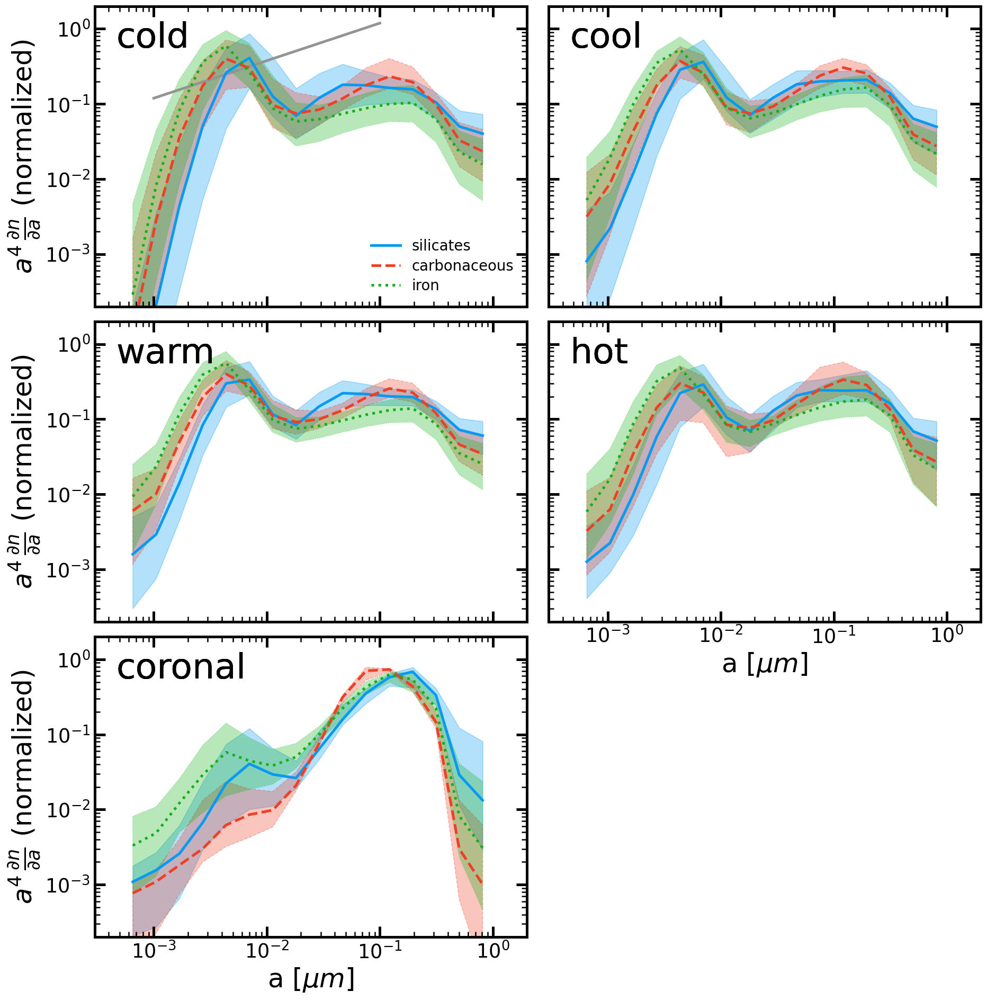

In [118]:

foutname = 'grain_dmdloga_ISM_phases.pdf'


species=['silicates','carbonaceous','iron']
ISM_phases = ['cold','cool','warm','hot','coronal']
factor_clumping=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1




for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)
    num_specs = len(species)
    num_phases = len(ISM_phases)


    fig = Figure(num_phases,ncols=2, sharex='col',sharey='row')

    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    for i,phase in enumerate(ISM_phases):
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase,factor_clumping=factor_clumping)
        print("ISM phase:",phase)
        print('gas mass', np.sum(G.get_property('mass')[mask])/1E10,'Msol')

        fig.set_axis(i, 'grain_size', 'dm/dloga_norm',y_lim=[2E-4,2E-0])

        if i==0:
            y_offset = 0.4
            MRN_a_vals = np.logspace(-3,-1,10)
            dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
            dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
            fig.plot_line_data(i,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle='-')
            for j, spec in enumerate(species):
                # Lines used for the legend handles. Should not show up in plot
                fig.plot_line_data(0,[-1,-1],[-1,-1], color='xkcd:black',linestyle=linestyles[j],label=spec)
        
 
        for j, spec in enumerate(species):
            
            grain_size_vals, percentile_dnda, percentile_dmdloga = \
                grain_size_utils.get_grain_size_distribution(G, 
                                                             species=spec, 
                                                             mask=mask, 
                                                             points_per_bin=points_per_bin, 
                                                             std_percentiles = [16, 84])


            fig.plot_line_data(i,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec)
            fig.plot_shaded_region(i,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])
            fig.add_text(i,0.05,0.95,phase,ha='left', va='top',)

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
ISM phase: cold
gas mass 0.0090562384 Msol
ISM phase: cool
gas mass 0.0079920488 Msol
ISM phase: warm
gas mass 0.1399658496 Msol
ISM phase: hot
gas mass 0.0009243492 Msol


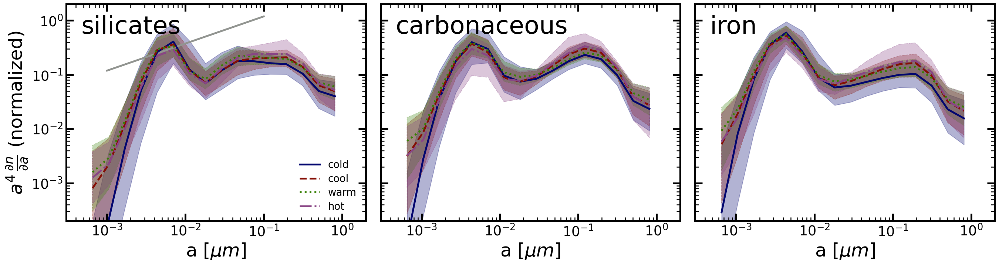

In [127]:

foutname = 'grain_dmdloga_ISM_phases.pdf'


species=['silicates','carbonaceous','iron']
ISM_phases = ['cold','cool','warm','hot']
factor_clumping=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1




for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)
    num_specs = len(species)
    num_phases = len(ISM_phases)


    fig = Figure(num_specs,ncols=3, sharex='col',sharey='row')

    colors = config.LINE_COLORS[:num_phases]
    colors=['xkcd:red']
    linestyles = config.LINE_STYLES[:num_phases]
    linewidth = 2*config.BASE_LINEWIDTH

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))

    for i, spec in enumerate(species):

        

        fig.set_axis(i, 'grain_size', 'dm/dloga_norm',y_lim=[2E-4,2E-0])

        if i==0:
            y_offset = 0.4
            MRN_a_vals = np.logspace(-3,-1,10)
            dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
            dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
            fig.plot_line_data(i,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle='-')
            # for j, spec in enumerate(species):
            #     # Lines used for the legend handles. Should not show up in plot
            #     fig.plot_line_data(0,[-1,-1],[-1,-1], color='xkcd:black',linestyle=linestyles[j],label=spec)
        
 
        for j,phase in enumerate(ISM_phases):
            mask = calc.get_particle_mask(0, halo, mask_criteria=phase,factor_clumping=factor_clumping)
            if i==0:
                print("ISM phase:",phase)
                print('gas mass', np.sum(G.get_property('mass')[mask])/1E10,'Msol')
                
            grain_size_vals, percentile_dnda, percentile_dmdloga = \
                grain_size_utils.get_grain_size_distribution(G, 
                                                             species=spec, 
                                                             mask=mask, 
                                                             points_per_bin=points_per_bin, 
                                                             std_percentiles = [16, 84])


            fig.plot_line_data(i,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=phase)
            fig.plot_shaded_region(i,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])
        fig.add_text(i,0.05,0.95,spec,ha='left', va='top',)

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

### Size Distribution and Extinction Curve in one plot

/N/project/choban_group/cchoban/gizmo_test/restart2/output
Snapshot time: 0.9000000000000006
Total dust mass sources: [5.6747305e+06 1.3765752e+03 1.7322758e+06 8.0138102e+04]
['silicates'] ['silicates', 'carbonaceous', 'iron']
 Will truncate grain sizes beyond supported range.
['carbonaceous'] ['silicates', 'carbonaceous', 'iron']
 Will truncate grain sizes beyond supported range.
['iron'] ['silicates', 'carbonaceous', 'iron']
 Will truncate grain sizes beyond supported range.
['silicates', 'carbonaceous', 'iron'] ['silicates', 'carbonaceous', 'iron']
 Will truncate grain sizes beyond supported range.


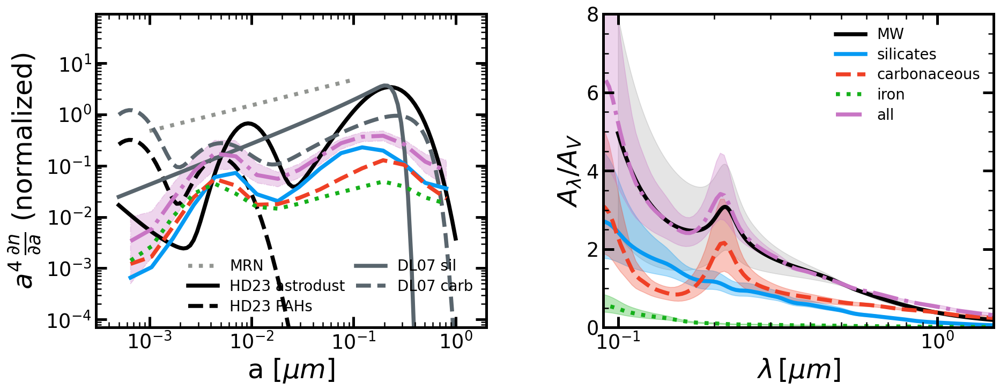

In [ ]:

foutname = 'dmdloga_AV_all_gas.pdf'


species=['silicates','carbonaceous','iron', 'all']
#species=['silicates','carbonaceous','all']
ISM_phase = 'all'

include_idealized_MRN=True
include_idealized_astrodust=True
include_idealized_DraineLi=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1


# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1 


for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(2)
    num_specs = len(species)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH

    fig.set_axis(0, 'grain_size', 'dm/dloga_norm', y_lim=[7E-5,9E1])
    fig.set_axis(1, 'lambda', 'A_lambda', x_lim=[0.09,1.5],y_lim=[0,8])

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    obs_linewidth = 1.5*config.BASE_LINEWIDTH
    obs_alpha = 1
    if include_idealized_MRN:
        y_offset = 1
        MRN_a_vals = np.logspace(-3,-1,10)
        dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
        dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
        fig.plot_line_data(0,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle=':', linewidth=obs_linewidth,
                            label='MRN', alpha = obs_alpha)
        # x_coord = MRN_a_vals[len(MRN_a_vals)//4]
        # y_coord = 1.1*dmdloga_vals[len(MRN_a_vals)//2]
        # fig.add_text(0,x_coord,y_coord,r'$\frac{\partial n}{\partial a}\propto a^{-3.5}$',
        #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')
    if include_idealized_astrodust:
        idealized_bins = 100
        amin = 5E-4; amax = 1
        astrodust_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
        # Normalize astrodust+PAHs
        dmdloga_norm = quad(grain_size_utils.astrodust_dmdloga, amin, amax)[0] + quad(grain_size_utils.astrodust_dmdloga, amin, amax, args=(True))[0]
        # astrodust
        dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=False)/dmdloga_norm
        fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='-', linewidth=obs_linewidth,
                            label='HD23 astrodust', alpha = obs_alpha)
        # PAHs
        dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=True)/dmdloga_norm
        
        fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='--', linewidth=obs_linewidth,
                            label='HD23 PAHs', alpha = obs_alpha)
        # x_coord = astrodust_a_vals[len(astrodust_a_vals)//4]
        # y_coord = dmdloga_vals[len(astrodust_a_vals)//2]
        # fig.add_text(0,x_coord,y_coord,r'astrodust',
        #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')    

    if include_idealized_DraineLi:
        idealized_bins = 100
        amin = 5E-4; amax = 1
        DL_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
        # Normalize astrodust+PAHs
        dmdloga_norm = quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("silicates"))[0] + quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("carbonaceous"))[0]
        # silicates
        dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='silicates')/dmdloga_norm
        
        fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='-', linewidth=obs_linewidth,
                            label='DL07 sil', alpha = obs_alpha)
        # carbonaceous
        dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='carbonaceous')/dmdloga_norm
        
        fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='--', linewidth=obs_linewidth,
                            label='DL07 carb', alpha = obs_alpha)     
    fig.set_axis_legend(0,ncol=2,rescale_font=0.75)           

    # Plot observed extinction curves
    galaxy_names = ['MW','LMC','LMC_30Dor','SMC']
    galaxy_names = ['MW']
    obs_colors = ['xkcd:black','xkcd:gold','xkcd:gold','xkcd:blue']
    obs_linestyles = ['-','-','--','-']
    subsamples = [0,2,2,2]
    for i, galaxy_name in enumerate(galaxy_names):
        wavelengths, A_lambda_percentiles = obs.Salim20_compiled_extinction_curve(galaxy_name, subsample=subsamples[i])
        fig.plot_line_data(1,wavelengths,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, 
                            color=obs_colors[i],linestyle=obs_linestyles[i], label = galaxy_name, std_kwargs={'alpha':0.1},linewidth=obs_linewidth)



    mask = calc.get_particle_mask(0, halo, mask_criteria=ISM_phase)
    
    for j, spec in enumerate(species):
        grain_size_vals, percentile_dnda, percentile_dmdloga = \
            grain_size_utils.get_grain_size_distribution(G,  
                                                            dust_species=spec, 
                                                            mask=mask, 
                                                            points_per_bin=points_per_bin, 
                                                            std_percentiles = [16, 84])

        fig.plot_line_data(0,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec, linewidth=obs_linewidth)
        if spec == 'all':
            fig.plot_shaded_region(0,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])

        wavelength_points, A_lambda_percentiles = grain_size_utils.calculate_extinction_curve(G,dust_species=spec, mask=mask, std_percentiles = [16, 84], bin_subsamples=bin_subsamples)
        fig.plot_line_data(1,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[j],linestyle=linestyles[j], label = spec, linewidth=obs_linewidth)
        # if spec == 'all':
        #     fig.plot_line_data(1,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[j],linestyle=linestyles[j], label = spec, linewidth=obs_linewidth)
        # else:
        #     fig.plot_line_data(1,wavelength_points,A_lambda_percentiles[0], color=colors[j],linestyle=linestyles[j], label = spec, linewidth=obs_linewidth)


    fig.set_axis_legend(1,ncol=1,rescale_font=0.75)      

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.


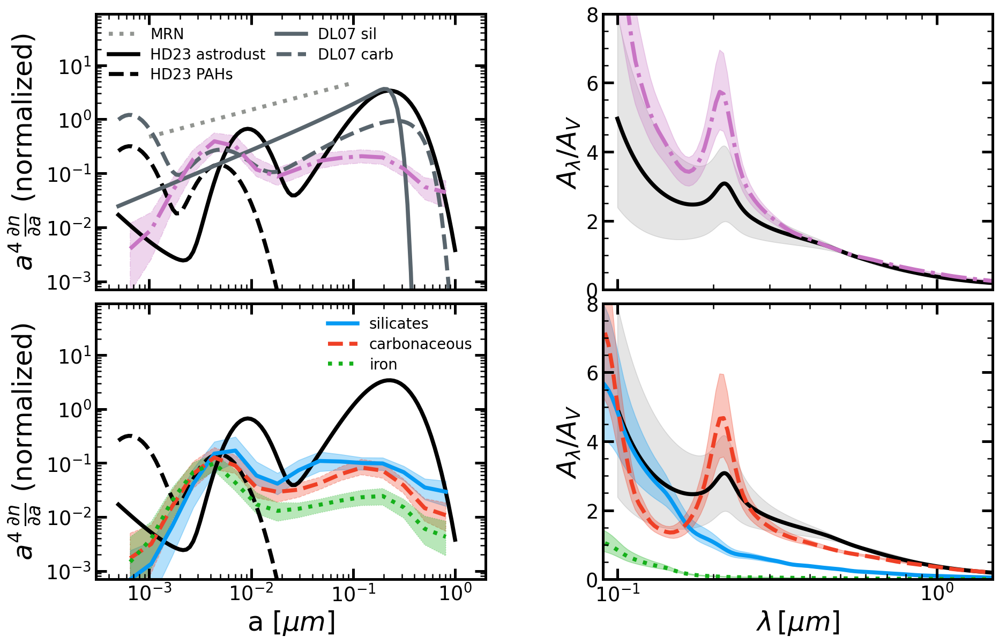

In [13]:

foutname = 'dmdloga_AV_species.pdf'


species=['silicates','carbonaceous','iron', 'all']
ISM_phase = 'all'

include_idealized_MRN=True
include_idealized_astrodust=True
include_idealized_DraineLi=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1


# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1 


for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(4, yx_ratio=0.9, sharex='col')
    num_specs = len(species)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH

    fig.set_axis(0, 'grain_size', 'dm/dloga_norm', y_lim=[7E-4,9E1])
    fig.set_axis(1, 'lambda', 'A_lambda', x_lim=[0.09,1.5],y_lim=[0,8])
    fig.set_axis(2, 'grain_size', 'dm/dloga_norm', y_lim=[7E-4,9E1])
    fig.set_axis(3, 'lambda', 'A_lambda', x_lim=[0.09,1.5],y_lim=[0,8])

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    obs_linewidth = 1.5*config.BASE_LINEWIDTH
    obs_alpha = 1
    if include_idealized_MRN:
        y_offset = 1
        MRN_a_vals = np.logspace(-3,-1,10)
        dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
        dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
        fig.plot_line_data(0,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle=':', linewidth=obs_linewidth,
                            label='MRN', alpha = obs_alpha)
        # x_coord = MRN_a_vals[len(MRN_a_vals)//4]
        # y_coord = 1.1*dmdloga_vals[len(MRN_a_vals)//2]
        # fig.add_text(0,x_coord,y_coord,r'$\frac{\partial n}{\partial a}\propto a^{-3.5}$',
        #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')
    if include_idealized_astrodust:
        idealized_bins = 100
        amin = 5E-4; amax = 1
        astrodust_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
        # Normalize astrodust+PAHs
        dmdloga_norm = quad(grain_size_utils.astrodust_dmdloga, amin, amax)[0] + quad(grain_size_utils.astrodust_dmdloga, amin, amax, args=(True))[0]
        # astrodust
        dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=False)/dmdloga_norm
        fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='-', linewidth=obs_linewidth,
                            label='HD23 astrodust', alpha = obs_alpha)
        fig.plot_line_data(2,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='-', linewidth=obs_linewidth,
                            alpha = obs_alpha)
        # PAHs
        dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=True)/dmdloga_norm
        
        fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='--', linewidth=obs_linewidth,
                            label='HD23 PAHs', alpha = obs_alpha)
        fig.plot_line_data(2,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='--', linewidth=obs_linewidth,
                            alpha = obs_alpha)
        # x_coord = astrodust_a_vals[len(astrodust_a_vals)//4]
        # y_coord = dmdloga_vals[len(astrodust_a_vals)//2]
        # fig.add_text(0,x_coord,y_coord,r'astrodust',
        #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')    

    if include_idealized_DraineLi:
        idealized_bins = 100
        amin = 5E-4; amax = 1
        DL_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
        # Normalize astrodust+PAHs
        dmdloga_norm = quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("silicates"))[0] + quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("carbonaceous"))[0]
        # silicates
        dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='silicates')/dmdloga_norm
        
        fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='-', linewidth=obs_linewidth,
                            label='DL07 sil', alpha = obs_alpha)
        # carbonaceous
        dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='carbonaceous')/dmdloga_norm
        
        fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='--', linewidth=obs_linewidth,
                            label='DL07 carb', alpha = obs_alpha)     
    fig.set_axis_legend(0,ncol=2,rescale_font=0.75,loc='upper left')           

    # Plot observed extinction curves
    galaxy_names = ['MW','LMC','LMC_30Dor','SMC']
    galaxy_names = ['MW']
    obs_colors = ['xkcd:black','xkcd:gold','xkcd:gold','xkcd:blue']
    obs_linestyles = ['-','-','--','-']
    subsamples = [0,2,2,2]
    for i, galaxy_name in enumerate(galaxy_names):
        wavelengths, A_lambda_percentiles = obs.Salim20_compiled_extinction_curve(galaxy_name, subsample=subsamples[i])
        fig.plot_line_data(1,wavelengths,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, 
                            color=obs_colors[i],linestyle=obs_linestyles[i], label = galaxy_name, std_kwargs={'alpha':0.1},linewidth=obs_linewidth)
        fig.plot_line_data(3,wavelengths,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, 
                            color=obs_colors[i],linestyle=obs_linestyles[i], label = galaxy_name, std_kwargs={'alpha':0.1},linewidth=obs_linewidth)



    mask = calc.get_particle_mask(0, halo, mask_criteria=ISM_phase)
    
    for j, spec in enumerate(species):
        grain_size_vals, percentile_dnda, percentile_dmdloga = \
            grain_size_utils.get_grain_size_distribution(G,  
                                                            dust_species=spec, 
                                                            mask=mask, 
                                                            points_per_bin=points_per_bin, 
                                                            std_percentiles = [16, 84])

        
        if spec == 'all':
            fig.plot_line_data(0,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec, linewidth=obs_linewidth)
            fig.plot_shaded_region(0,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])
        else:
            fig.plot_line_data(2,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec, linewidth=obs_linewidth)
            fig.plot_shaded_region(2,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])            

        wavelength_points, A_lambda_percentiles = grain_size_utils.calculate_extinction_curve(G,species=spec, mask=mask, std_percentiles = [16, 84], bin_subsamples=bin_subsamples)
        if spec == 'all':
            fig.plot_line_data(1,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[j],linestyle=linestyles[j], label = spec, linewidth=obs_linewidth)
        else:
            fig.plot_line_data(3,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T,color=colors[j],linestyle=linestyles[j], label = spec, linewidth=obs_linewidth)


    fig.set_axis_legend(2,ncol=1,rescale_font=0.75)      

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.


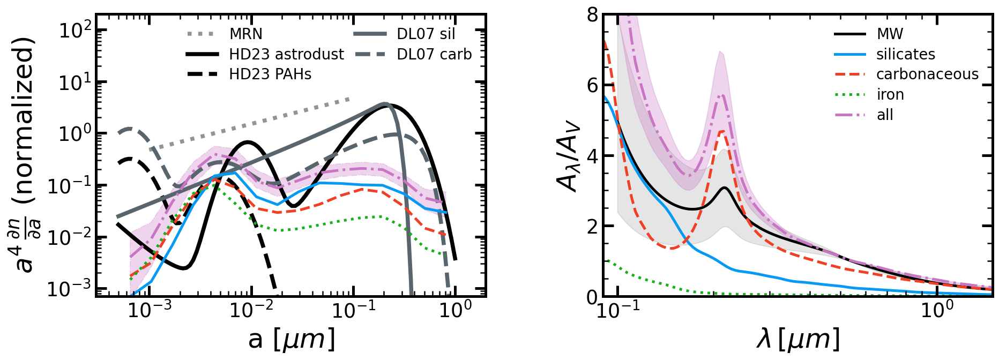

In [59]:

foutname = 'dmdloga_AV_all_gas.pdf'


species=['silicates','carbonaceous','iron', 'all']
ISM_phase = 'all'

include_idealized_MRN=True
include_idealized_astrodust=True
include_idealized_DraineLi=True

# number of points per bin
# Any points_per_bin > 1 will follow the slopes in each bin so it can look odd
points_per_bin=1


# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1 


for k,halo in enumerate(galaxies):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(2, yx_ratio=0.9)
    num_specs = len(species)
    num_phases = len(ISM_phases)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH

    fig.set_axis(0, 'grain_size', 'dm/dloga_norm', y_lim=[7E-4,2E2])
    fig.set_axis(1, 'lambda', 'A_lambda', x_lim=[0.09,1.5],y_lim=[0,8])

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    obs_linewidth = 1.5*config.BASE_LINEWIDTH
    obs_alpha = 1
    if include_idealized_MRN:
        y_offset = 1
        MRN_a_vals = np.logspace(-3,-1,10)
        dmdloga_norm = quad(grain_size_utils.MRN_dmdloga, sp.Grain_Size_Min, sp.Grain_Size_Max)[0]
        dmdloga_vals = grain_size_utils.MRN_dmdloga(MRN_a_vals)/dmdloga_norm * np.power(10,y_offset)
        fig.plot_line_data(0,MRN_a_vals,dmdloga_vals, color='xkcd:grey',linestyle=':', linewidth=obs_linewidth,
                            label='MRN', alpha = obs_alpha)
        # x_coord = MRN_a_vals[len(MRN_a_vals)//4]
        # y_coord = 1.1*dmdloga_vals[len(MRN_a_vals)//2]
        # fig.add_text(0,x_coord,y_coord,r'$\frac{\partial n}{\partial a}\propto a^{-3.5}$',
        #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')
    if include_idealized_astrodust:
        idealized_bins = 100
        amin = 5E-4; amax = 1
        astrodust_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
        # Normalize astrodust+PAHs
        dmdloga_norm = quad(grain_size_utils.astrodust_dmdloga, amin, amax)[0] + quad(grain_size_utils.astrodust_dmdloga, amin, amax, args=(True))[0]
        # astrodust
        dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=False)/dmdloga_norm
        fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='-', linewidth=obs_linewidth,
                            label='HD23 astrodust', alpha = obs_alpha)
        # PAHs
        dmdloga_vals=grain_size_utils.astrodust_dmdloga(astrodust_a_vals,PAHs=True)/dmdloga_norm
        
        fig.plot_line_data(0,astrodust_a_vals,dmdloga_vals, color='xkcd:black',linestyle='--', linewidth=obs_linewidth,
                            label='HD23 PAHs', alpha = obs_alpha)
        # x_coord = astrodust_a_vals[len(astrodust_a_vals)//4]
        # y_coord = dmdloga_vals[len(astrodust_a_vals)//2]
        # fig.add_text(0,x_coord,y_coord,r'astrodust',
        #             ha='right', va='bottom',rescale_font=0.5, xycoords='data',color='xkcd:grey')    

    if include_idealized_DraineLi:
        idealized_bins = 100
        amin = 5E-4; amax = 1
        DL_a_vals = np.logspace(np.log10(amin),np.log10(amax),idealized_bins)
        # Normalize astrodust+PAHs
        dmdloga_norm = quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("silicates"))[0] + quad(grain_size_utils.DL07_dmdloga, amin, amax, args=("carbonaceous"))[0]
        # silicates
        dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='silicates')/dmdloga_norm
        
        fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='-', linewidth=obs_linewidth,
                            label='DL07 sil', alpha = obs_alpha)
        # carbonaceous
        dmdloga_vals=grain_size_utils.DL07_dmdloga(DL_a_vals,species='carbonaceous')/dmdloga_norm
        
        fig.plot_line_data(0,DL_a_vals,dmdloga_vals, color='xkcd:slate grey',linestyle='--', linewidth=obs_linewidth,
                            label='DL07 carb', alpha = obs_alpha)                

    # Force all obs size distribution legend elements on first plot
    fig.set_axis_legend(0,ncol=2,rescale_font=0.75)

    # Plot observed extinction curves
    galaxy_names = ['MW','LMC','LMC_30Dor','SMC']
    galaxy_names = ['MW']
    obs_colors = ['xkcd:black','xkcd:gold','xkcd:gold','xkcd:blue']
    obs_linestyles = ['-','-','--','-']
    subsamples = [0,2,2,2]
    for i, galaxy_name in enumerate(galaxy_names):
        wavelengths, A_lambda_percentiles = obs.Salim20_compiled_extinction_curve(galaxy_name, subsample=subsamples[i])
        fig.plot_line_data(1,wavelengths,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, 
                            color=obs_colors[i],linestyle=obs_linestyles[i], label = galaxy_name, std_kwargs={'alpha':0.1})



    mask = calc.get_particle_mask(0, halo, mask_criteria=ISM_phase)
    
    for j, spec in enumerate(species):
        grain_size_vals, percentile_dnda, percentile_dmdloga = \
            grain_size_utils.get_grain_size_distribution(G,  
                                                            dust_species=spec, 
                                                            mask=mask, 
                                                            points_per_bin=points_per_bin, 
                                                            std_percentiles = [16, 84])

        fig.plot_line_data(0,grain_size_vals,percentile_dmdloga[0], color=colors[j],linestyle=linestyles[j], label=spec)
        if spec == 'all':
            fig.plot_shaded_region(0,grain_size_vals,percentile_dmdloga[1],percentile_dmdloga[2], color=colors[j],linestyle=linestyles[j])

        wavelength_points, A_lambda_percentiles = grain_size_utils.calculate_extinction_curve(G,species=spec, mask=mask, std_percentiles = [16, 84], bin_subsamples=bin_subsamples)
        if spec == 'all':
            fig.plot_line_data(1,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[j],linestyle=linestyles[j], label = spec)
        else:
            fig.plot_line_data(1,wavelength_points,A_lambda_percentiles[0], color=colors[j],linestyle=linestyles[j], label = spec)

    # Second plot will have simulation legend handles
    fig.set_axis_legend(1,ncol=1,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+file_prefix+'_'+foutname)

### Extinction Curves

#### $A_V$ Idealized


Assuming MRN size distribution with a MW dust-to-gas ratio, Av/NH ~ 0.5E-22

In [183]:
grain_size_utils.calculate_idealized_Av(NH = 5.8E21,
                        DTG = 0.014*0.5,
                        amin = 1E-3,
                        amax = 3E-1,
                        sil_to_carbon_ratio = 2.0,
                        MRN_slope = -3.5)

3.1710604852765947

Histogram of NH for all gas cells

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
ISM phase: all
193646 gas cells in mask
Median NH: 4.665004932703597e+19
idealized AV
0.000295849672808391 3.5749439941205146 0.025505194492615138
Fraction of gas with AV>0.1: 0.04445945316952215
 Will truncate grain sizes beyond supported range.
real AV
1.669463414153287e-06 2.080028591568141 0.013993763492051066
Fraction of gas with AV>0.1: 0.01951044725682578
/N/project/choban_group/cchoban/size_evo_suite/variations/10xVCoag/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [6.4692545e+06 1.2737343e+03 1.6225698e+06 7.8959227e+04]
ISM phase: all
191584 gas cells in mask
Median NH: 4.373387081843971e+19
idealized AV
0.0001495051740979019 0.7387527450741699 0.02391081890009402
Fraction of gas with AV>0.1: 0.022152304356145153
 Will truncate grain sizes beyond supported range.
real 

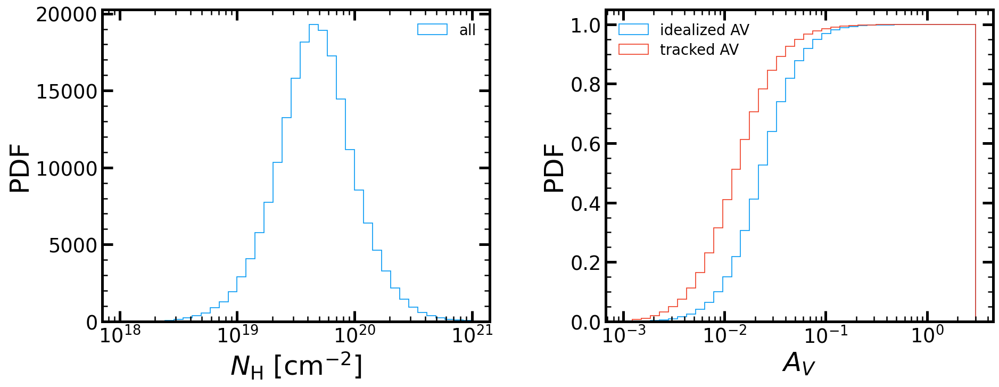

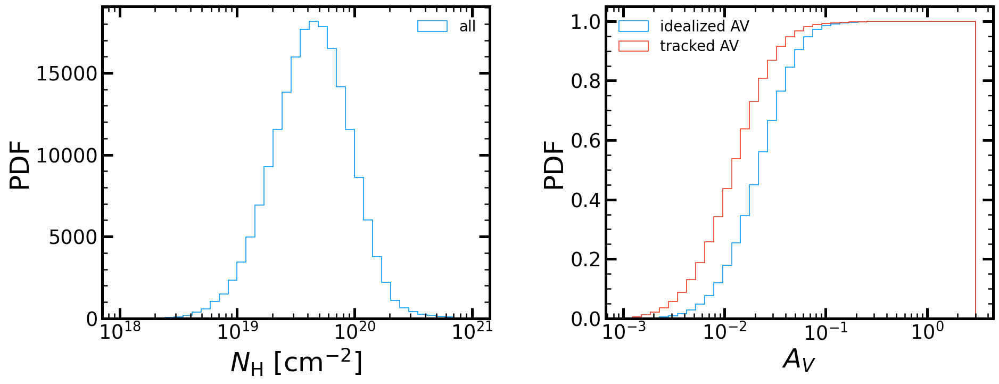

In [199]:
foutname = 'idealized_NH_AV_histogram.pdf'
ISM_phases = ['all']

NH_limits = [1E18,1E21]
AV_limits = [0.001,3]

colors = config.LINE_COLORS[:2]
linestyles = config.LINE_STYLES[:2]
linewidth = 2*config.BASE_LINEWIDTH

for k,halo in enumerate(galaxies):
    print(halo.sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)


    fig = Figure(2)
    fig.set_axis(0, 'NH', 'PDF', x_lim=NH_limits, y_lim=[0,1], y_label = 'PDF', y_log = False)
    fig.set_axis(1, 'A_V', 'PDF', x_lim=AV_limits, y_lim=[0,1], y_label = 'PDF', y_log = False)

    print("Snapshot time:",halo.sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))

    for i,phase in enumerate(ISM_phases):

        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)

        print("ISM phase:",phase)

        print(len(G.get_property('nH')[mask]),'gas cells in mask')

        # Some print outs to check column densities of gas cells
        hsml = np.asarray(G.get_property('size')[mask],dtype=np.float64) * config.kpc_to_cm * config.cm_to_um # [microns]
        gas_mass =  np.asarray(G.get_property('M_gas')[mask],dtype=np.float64)*config.Msolar_to_g # [grams]
        Sigma_H = gas_mass*0.7/config.H_MASS / (np.pi * hsml*config.um_to_cm * hsml*config.um_to_cm)

        print("Median NH:",np.median(Sigma_H))

        fig.plot_1Dhistogram(0, Sigma_H, bin_lims=NH_limits, bin_nums=40, bin_log=True, label=spec, color=colors[j],linestyle=linestyles[j],density=False,cumulative=False)

        idealized_AV = grain_size_utils.calculate_idealized_Av(NH = Sigma_H,
                        DTG = 0.014*0.5,
                        amin = 1E-3,
                        amax = 3E-1,
                        sil_to_carbon_ratio = 2.0,
                        MRN_slope = -3.5) 
        
        print('idealized AV')
        print(np.min(idealized_AV), np.max(idealized_AV), np.median(idealized_AV))
        print("Fraction of gas with AV>0.1:", np.sum(gas_mass[idealized_AV>0.1])/np.sum(gas_mass))
              
        fig.plot_1Dhistogram(1, idealized_AV, bin_lims=AV_limits, bin_nums=40, bin_log=True, color=colors[0],linestyle=linestyles[0],density=True,cumulative=True,label='idealized AV')

        A_V = grain_size_utils.calculate_Av(G, 
                                            species='all', 
                                            mask = mask, 
                                            bin_subsamples = bin_subsamples)
        print('real AV')
        print(np.min(A_V), np.max(A_V), np.median(A_V))
        print("Fraction of gas with AV>0.1:", np.sum(gas_mass[A_V>0.1])/np.sum(gas_mass))
        
        fig.plot_1Dhistogram(1, A_V, bin_lims=AV_limits, bin_nums=40, bin_log=True, color=colors[1],linestyle=linestyles[j],density=True,cumulative=True,label='tracked AV')

        

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(halo.sp.snum)+'_'+file_prefix+'_'+foutname)

#### $A_V$ Histogram

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
ISM phase: all
193646 gas cells in mask
D/Z [0.04967184 0.07732506 0.24194607 ... 0.21700661 0.29406562 0.23893118]
Sigma H: [3.64283855e+18 5.85707754e+18 8.34273322e+18 ... 3.20022403e+19
 1.50289591e+19 4.80135673e+18]
Sigma dust: [3.21985497e+09 9.50040862e+09 6.02144403e+10 ... 3.53033049e+11
 3.66476038e+11 6.42789963e+10]
 Will truncate grain sizes beyond supported range.
AV [0.00045763 0.00094941 0.002099   ... 0.0070057  0.00427509 0.00113462]
1.669463414153287e-06 2.080028591568141 0.013993763492051066
Fraction of gas with AV>0.1: 0.01951044725682578
Fraction of gas mass w/ NH> 0.15448542590891767
[0.03006687 0.08721501 0.04785789 ... 0.13746683 0.03566632 0.02797636]
0.0009098607460358836 2.080028591568141 0.04852237301627708
/N/project/choban_group/cchoban/size_evo_suite/variations/10xV

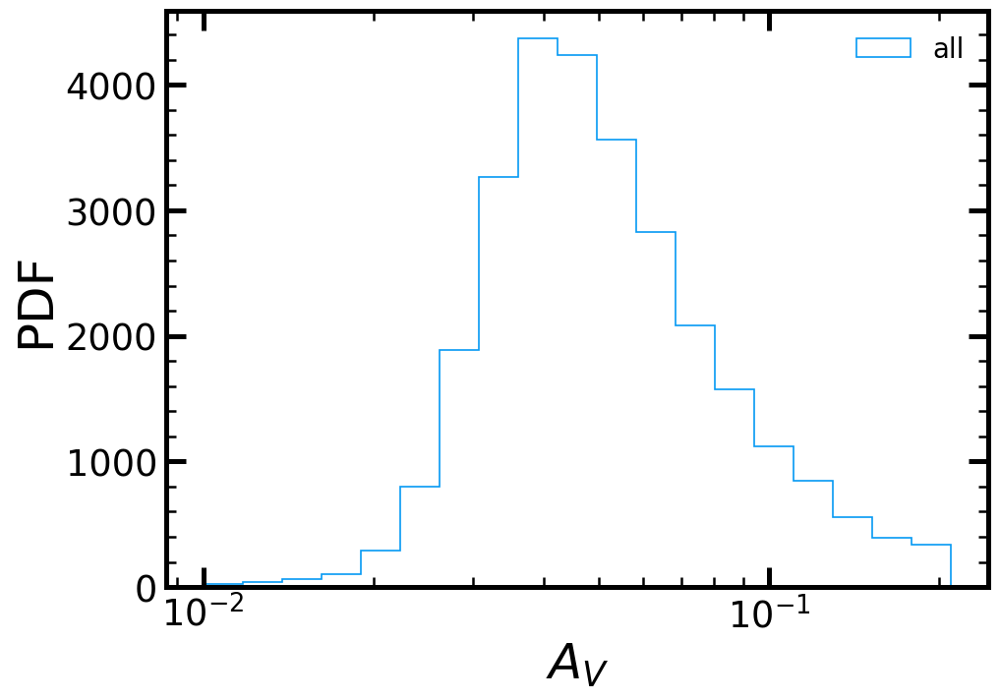

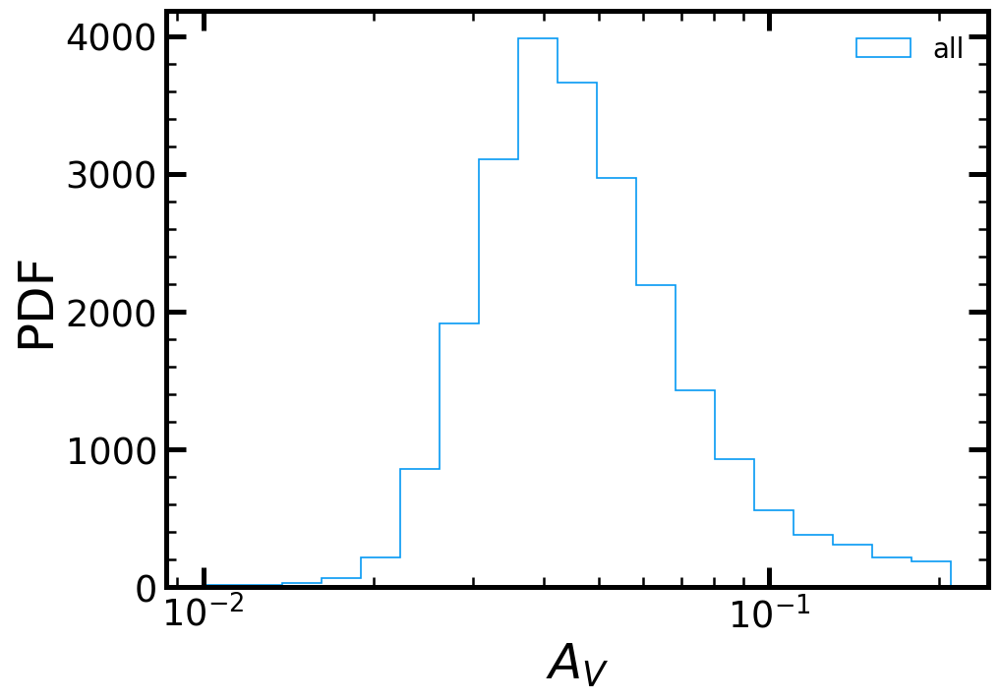

In [174]:
foutname = 'Av_histogram.pdf'
ISM_phases = ['all']
species=['all']



# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1

AV_limits = [0.01,0.21]
AV_log = True



for k,halo in enumerate(galaxies):
    print(halo.sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)


    fig = Figure(1)
    num_specs = len(species)
    num_phases = len(ISM_phases)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH
    fig.set_axis(0, 'A_V', 'PDF', x_lim=AV_limits, y_lim=[0,1], x_label=r'$A_V$', y_label = 'PDF', y_log = False, x_log=AV_log)

    print("Snapshot time:",halo.sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))

    for i,phase in enumerate(ISM_phases):

        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        #mask = np.zeros(G.npart,dtype=bool)
        #mask[0]=True
        #mask = (G.get_property('nH') > 1E1) & (G.get_property('T') < 1E4) & (G.get_property('D/Z') > 0.001)
        print("ISM phase:",phase)

        print(len(G.get_property('nH')[mask]),'gas cells in mask')

        # Some print outs to check column densities of gas cells
        print('D/Z',G.get_property('D/Z')[mask])
        hsml = np.asarray(G.get_property('size')[mask],dtype=np.float64) * config.kpc_to_cm * config.cm_to_um # [microns]
        gas_mass =  np.asarray(G.get_property('M_gas')[mask],dtype=np.float64)*config.Msolar_to_g # [grams]
        Sigma_H = gas_mass*0.7/config.H_MASS / (np.pi * hsml*config.um_to_cm * hsml*config.um_to_cm)
        bin_nums = G.get_property('grain_bin_num')[mask]
        sigma_dust = np.sum(bin_nums,axis=(1,2))/(np.pi * hsml*config.um_to_cm * hsml*config.um_to_cm)
        print("Sigma H:",Sigma_H)
        print("Sigma dust:",sigma_dust)

        for j, spec in enumerate(species):

            A_V = grain_size_utils.calculate_Av(G, 
                                                species=spec, 
                                                mask = mask, 
                                                bin_subsamples = bin_subsamples)
            print('AV',A_V)
            print(np.min(A_V), np.max(A_V), np.median(A_V))
            print("Fraction of gas with AV>0.1:", np.sum(gas_mass[A_V>0.1])/np.sum(gas_mass))
            

            NH_mask = (Sigma_H > 1E20)
            print("Fraction of gas mass w/ NH>", np.sum(gas_mass[NH_mask])/np.sum(gas_mass))
            print(A_V[NH_mask])
            print(np.min(A_V[NH_mask]), np.max(A_V[NH_mask]), np.median(A_V[NH_mask]))

            fig.plot_1Dhistogram(0, A_V[NH_mask], bin_lims=AV_limits, bin_nums=20, bin_log=AV_log, label=spec, color=colors[j],linestyle=linestyles[j],density=False,cumulative=False)

    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(halo.sp.snum)+'_'+file_prefix+'_'+foutname)

#### Normalized Extinction Curve ($A_{\lambda}/A_V$)

##### Idealized Extinction for MRN

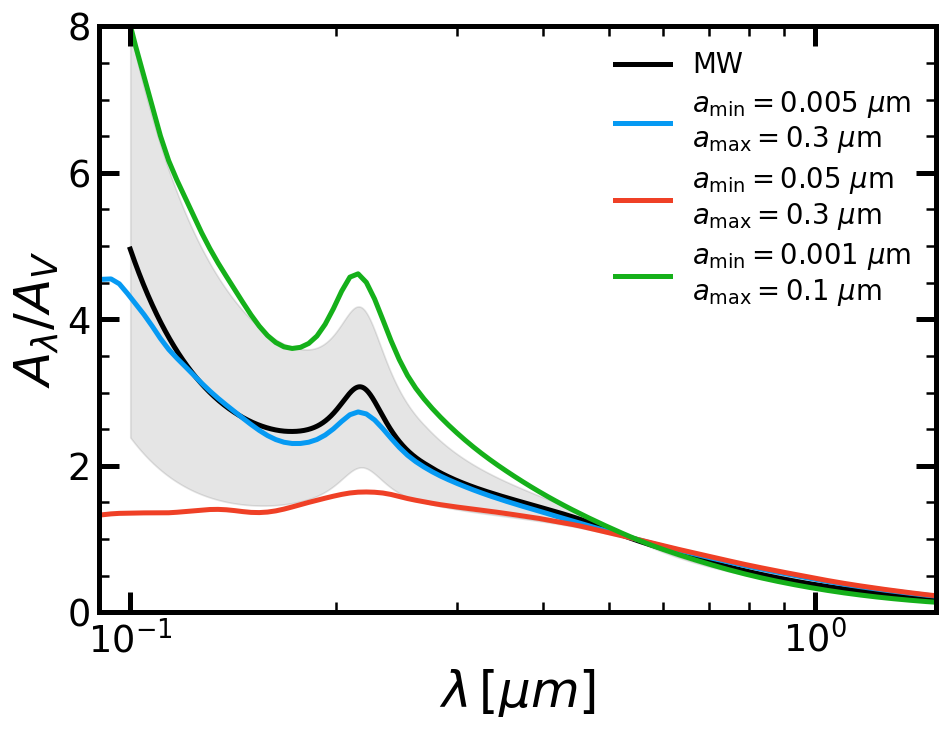

In [163]:

foutname = 'idealized_extinction_curve.pdf'




fig = Figure(1)
colors = config.LINE_COLORS[:10]
linestyles = config.LINE_STYLES[:10]
linewidth = 2*config.BASE_LINEWIDTH
fig.set_axis(0, 'lambda', 'A_lambda', x_lim=[0.09,1.5],y_lim=[0,8])



# Plot observed extinction curves
observations = ['MW',]
obs_colors = ['xkcd:black']
obs_linestyles = ['-']
subsamples = [0]
for i, galaxy in enumerate(observations):
    wavelengths, A_lambda_percentiles = obs.Salim20_compiled_extinction_curve(galaxy, subsample=subsamples[i])
    fig.plot_line_data(0,wavelengths,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, 
                        color=obs_colors[i],linestyle=obs_linestyles[i], label = galaxy, std_kwargs={'alpha':0.1})

# Plot idealized extinction curve
i=0
amin = 5E-3 # micron
amax = 0.3
wavelength_points, A_lambda_norm = grain_size_utils.calculate_idealized_extinction_curve(amin = amin, amax = amax)
fig.plot_line_data(0,wavelength_points,A_lambda_norm, color=colors[i],linestyle=linestyles[0], label=r'$a_{\rm min} = %1.1g$ $\mu$m'%amin + '\n' + r'$a_{\rm max} = %1.1g$ $\mu$m'%amax)

i=1
amin = 5E-2 # micron
amax = 0.3
wavelength_points, A_lambda_norm = grain_size_utils.calculate_idealized_extinction_curve(amin = amin, amax = amax)
fig.plot_line_data(0,wavelength_points,A_lambda_norm, color=colors[i],linestyle=linestyles[0], label=r'$a_{\rm min} = %1.1g$ $\mu$m'%amin + '\n' + r'$a_{\rm max} = %1.1g$ $\mu$m'%amax)


i=2
amin = 1E-3 # micron
amax = 0.15
wavelength_points, A_lambda_norm = grain_size_utils.calculate_idealized_extinction_curve(amin = amin, amax = amax)
fig.plot_line_data(0,wavelength_points,A_lambda_norm, color=colors[i],linestyle=linestyles[0], label=r'$a_{\rm min} = %1.1g$ $\mu$m'%amin + '\n' + r'$a_{\rm max} = %1.1g$ $\mu$m'%amax)

fig.set_all_legends(max_cols=2,rescale_font=0.75)

fig.save(plot_dir+foutname)

##### Simulation Extinction

/N/project/choban_group/cchoban/size_evo_suite/variations/Fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [7.2888870e+06 1.2617045e+03 1.5475264e+06 7.9043656e+04]
ISM phase: all
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.
 Will truncate grain sizes beyond supported range.


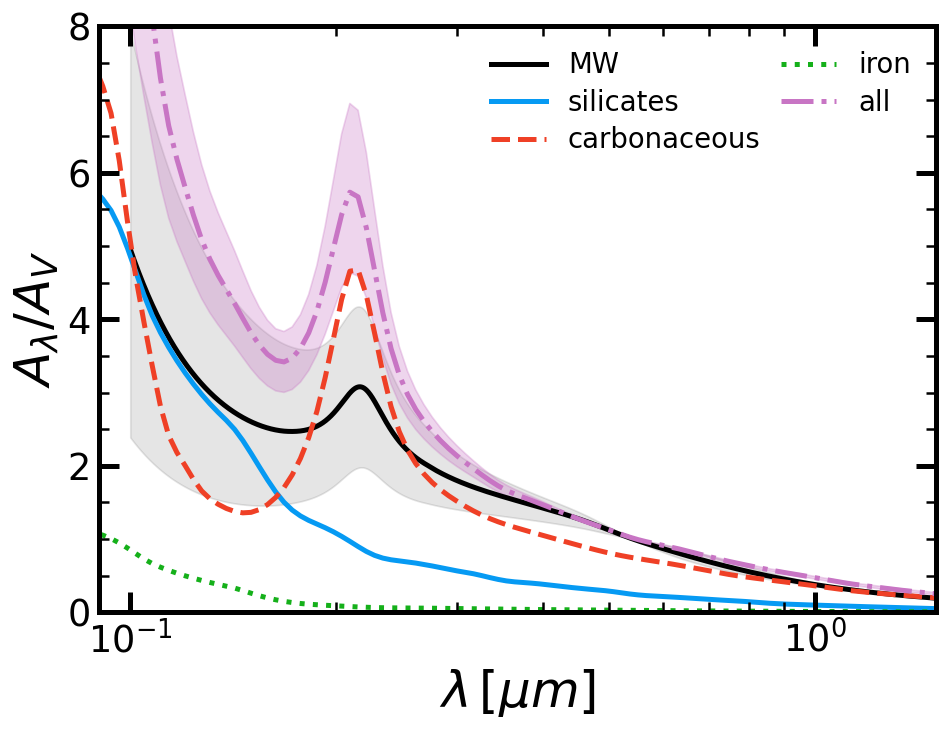

In [130]:

foutname = 'median_extinction_curve.pdf'
ISM_phases = ['all']
species=['silicates','carbonaceous', 'iron','all']



# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1 

for k,halo in enumerate(galaxies):
    print(halo.sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(1)
    num_specs = len(species)
    num_phases = len(ISM_phases)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH
    fig.set_axis(0, 'lambda', 'A_lambda', x_lim=[0.09,1.5],y_lim=[0,8])

    print("Snapshot time:",halo.sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    # Plot observed extinction curves
    galaxy_names = ['MW','LMC','LMC_30Dor','SMC']
    galaxy_names = ['MW']
    obs_colors = ['xkcd:black','xkcd:gold','xkcd:gold','xkcd:blue']
    obs_linestyles = ['-','-','--','-']
    subsamples = [0,2,2,2]
    for i, galaxy_name in enumerate(galaxy_names):
        wavelengths, A_lambda_percentiles = obs.Salim20_compiled_extinction_curve(galaxy_name, subsample=subsamples[i])
        fig.plot_line_data(0,wavelengths,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, 
                            color=obs_colors[i],linestyle=obs_linestyles[i], label = galaxy_name, std_kwargs={'alpha':0.1})

    for i,phase in enumerate(ISM_phases):

        G = halo.loadpart(0)
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        print("ISM phase:",phase)

        for j, spec in enumerate(species):

            wavelength_points, A_lambda_percentiles = grain_size_utils.calculate_extinction_curve(G,species=spec, mask=mask, std_percentiles = [16, 84], bin_subsamples=bin_subsamples)

            if spec == 'all':
                fig.plot_line_data(0,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[j],linestyle=linestyles[j], label = spec)
            else:
                fig.plot_line_data(0,wavelength_points,A_lambda_percentiles[0], color=colors[j],linestyle=linestyles[j], label = spec)


    fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(halo.sp.snum)+'_'+file_prefix+'_'+foutname)

In [ ]:

foutname = 'median_extinction_curve_gas_phases.pdf'
ISM_phases = ['cold','warm','hot','coronal']
species=['silicates','carbonaceous', 'iron','all']



# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1 

for k,sp in enumerate(snaps):
    if k!=0: continue
    print(sp.sdir)
    name = sim_names[k]
    G=sp.loadpart(0)

    num_specs = len(species)
    num_phases = len(ISM_phases)

    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH

    fig = Figure(num_phases, ncols=2, sharex='col',sharey='row')
    

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    for i,phase in enumerate(ISM_phases):
        mask = calc.get_particle_mask(0, sp, mask_criteria=phase)
        print("ISM phase:",phase)
        fig.set_axis(i, 'lambda', 'A_lambda', x_lim=[0.09,1.5])

        for j, spec in enumerate(species):

            wavelength_points, A_lambda_percentiles = grain_size_utils.calculate_extinction_curve(sp,species=spec, mask=mask, std_percentiles = [16, 84], bin_subsamples=1)

            fig.plot_line_data(i,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[j],linestyle=linestyles[j], label = spec)
            
        fig.add_text(i,0.05,0.95,phase,ha='left', va='top',)

fig.set_all_legends(max_cols=2,rescale_font=0.75)

    fig.save(plot_dir+name+'_'+str(sp.snum)+'_'+foutname)

/N/project/choban_group/cchoban/size_evo_suite/IC/fiducial/output
Snapshot time: 1.0000000000000007
Total dust mass sources: [1.7337712e+07 2.6421367e+03 1.0513381e+07 1.7137812e+05]
ISM phase: cold


 Will truncate grain sizes beyond supported range.
ISM phase: warm
 Will truncate grain sizes beyond supported range.
ISM phase: hot
 Will truncate grain sizes beyond supported range.
ISM phase: coronal
 Will truncate grain sizes beyond supported range.


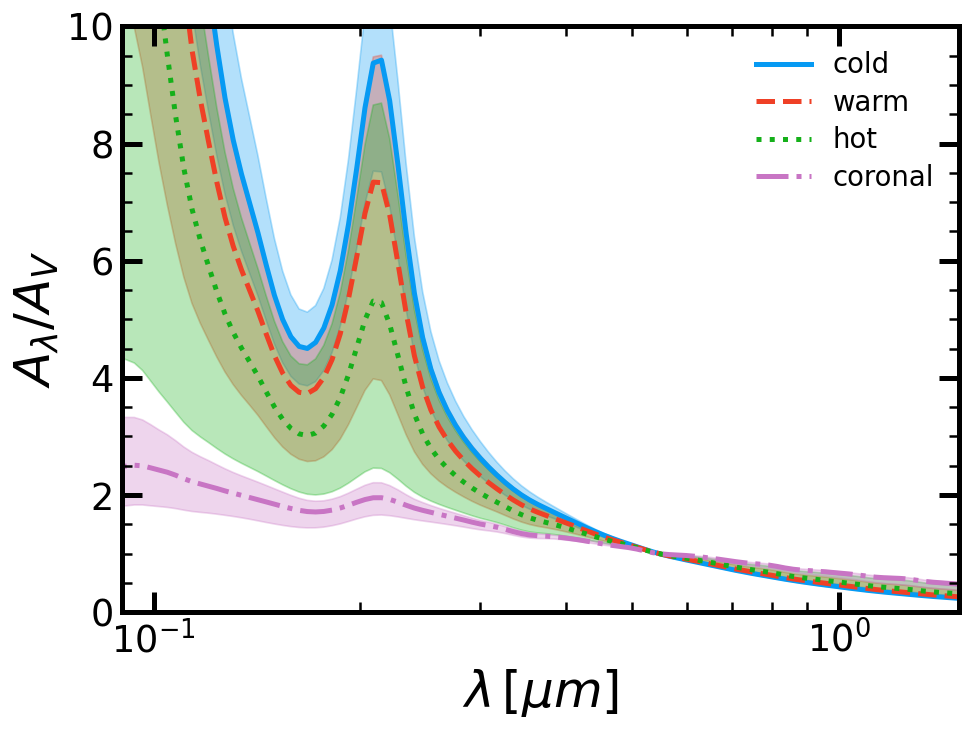

In [179]:
foutname = plot_dir + 'median_extinction_gas_phases.pdf'

ISM_phases = ['cold','warm','hot','coronal']
spec='all'


# Number of subsamples for each grain size bin when calculating the extinction curve
# If you set this to 1, it will use the center value of the bin
# Values > 1 are only needed for simulations with a small number of grain size bins
bin_subsamples = 1 

for k,halo in enumerate(galaxies):
    if k!=0: continue
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[k]
    G=halo.loadpart(0)

    fig = Figure(1)
    num_specs = len(species)
    num_phases = len(ISM_phases)
    colors = config.LINE_COLORS[:num_specs]
    linestyles = config.LINE_STYLES[:num_specs]
    linewidth = 2*config.BASE_LINEWIDTH
    fig.set_axis(0, 'lambda', 'A_lambda', x_lim=[0.09,1.5])

    print("Snapshot time:",sp.time)
    print("Total dust mass sources:",np.sum(G.get_property('M_dust')[:,np.newaxis]*G.get_property('dust_source'),axis=0))


    for i,phase in enumerate(ISM_phases):
        mask = calc.get_particle_mask(0, halo, mask_criteria=phase)
        print("ISM phase:",phase)

        wavelength_points, A_lambda_percentiles = grain_size_utils.calculate_extinction_curve(G,species=spec, mask=mask, std_percentiles = [16, 84], bin_subsamples=1)

        fig.plot_line_data(0,wavelength_points,A_lambda_percentiles[0], y_std=A_lambda_percentiles[[1,2]].T, color=colors[i],linestyle=linestyles[i], label = phase)

fig.set_all_legends(max_cols=2,rescale_font=0.75)
fig.save(foutname)

#### Shattering and Coagulation Mass Rate

/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output
/N/project/choban_group/cchoban/size_evo_suite//MW_Kolmogorov_ShatCoag/output


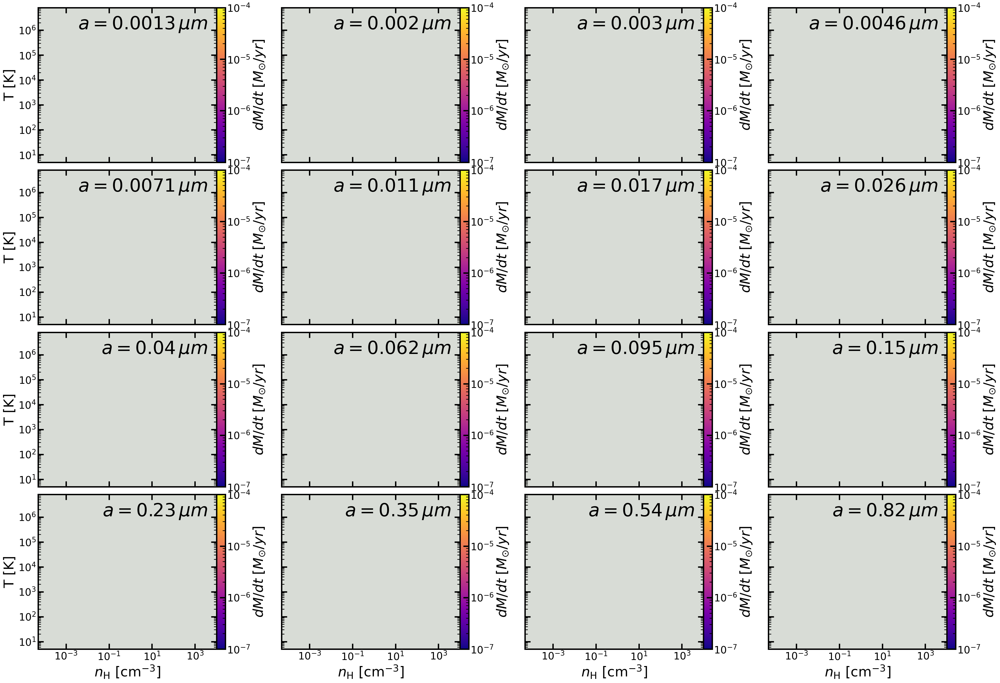

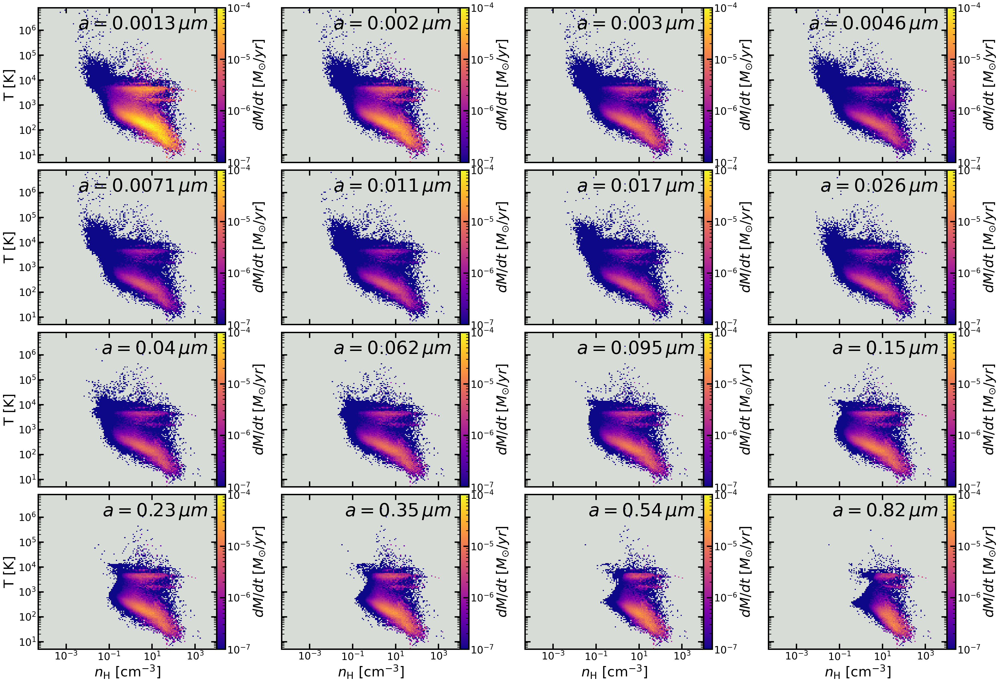

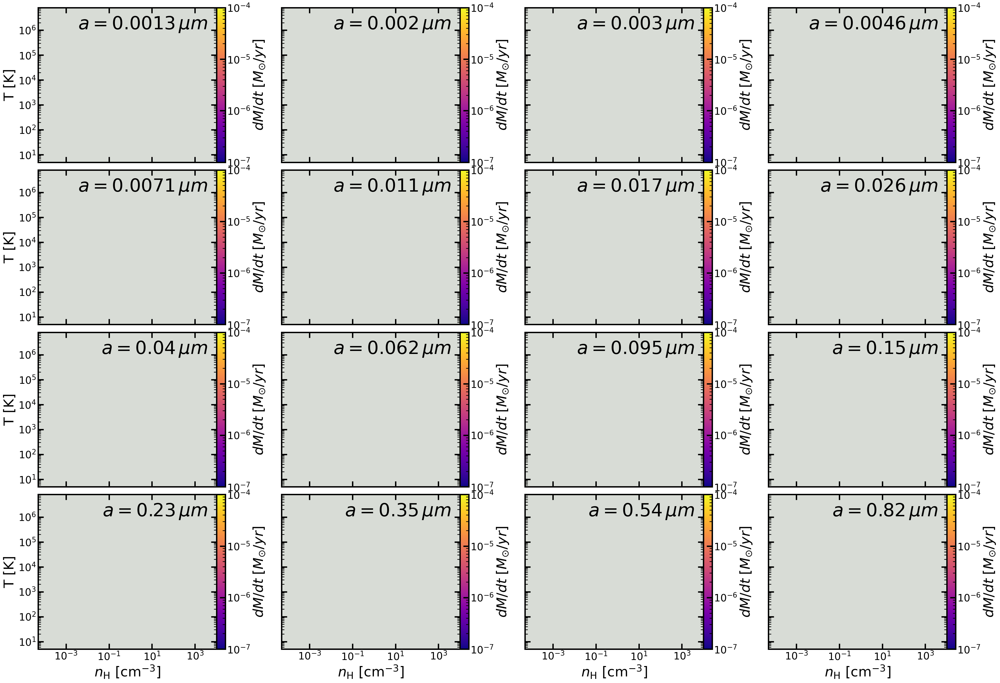

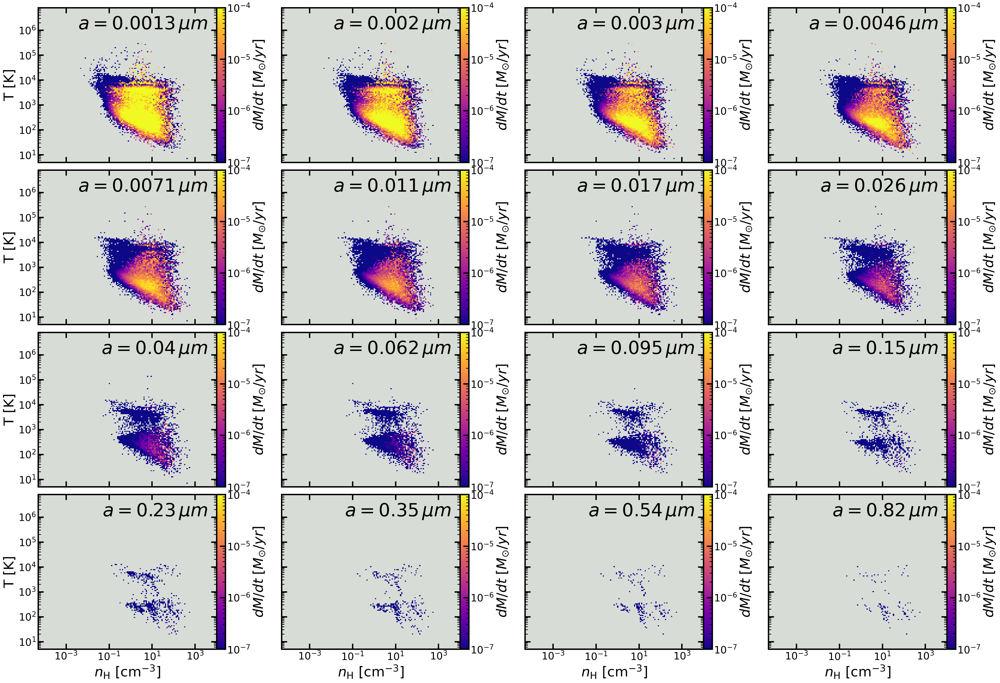

In [66]:

props = ['dMdt_coag','dMdt_shat']
fig_labels = ['coagulation','shattering']
spec_ind = 0
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


coag_lim=[1E-7,1E-4]
shat_lim=[1E-10,1E-7]


for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    grain_bins = halo.sp.Flag_GrainSizeBins
    a_centers = halo.sp.Grain_Bin_Centers

    G = halo.loadpart(0)





    foutname = 'coag_pos_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    coag_rate = G.get_property('grain_coag_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        coag_rate[coag_rate<0] = 0

        ret = calc.calc_phase_hist_data(coag_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=coag_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    
    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)



    foutname = 'coag_neg_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    coag_rate = G.get_property('grain_coag_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        coag_rate[coag_rate>0] = 0
        ret = calc.calc_phase_hist_data(-coag_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=coag_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    
    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)


/N/project/choban_group/cchoban/size_evo_suite/MW_ShatCoag_Only/output
/N/project/choban_group/cchoban/size_evo_suite//MW_Kolmogorov_ShatCoag/output


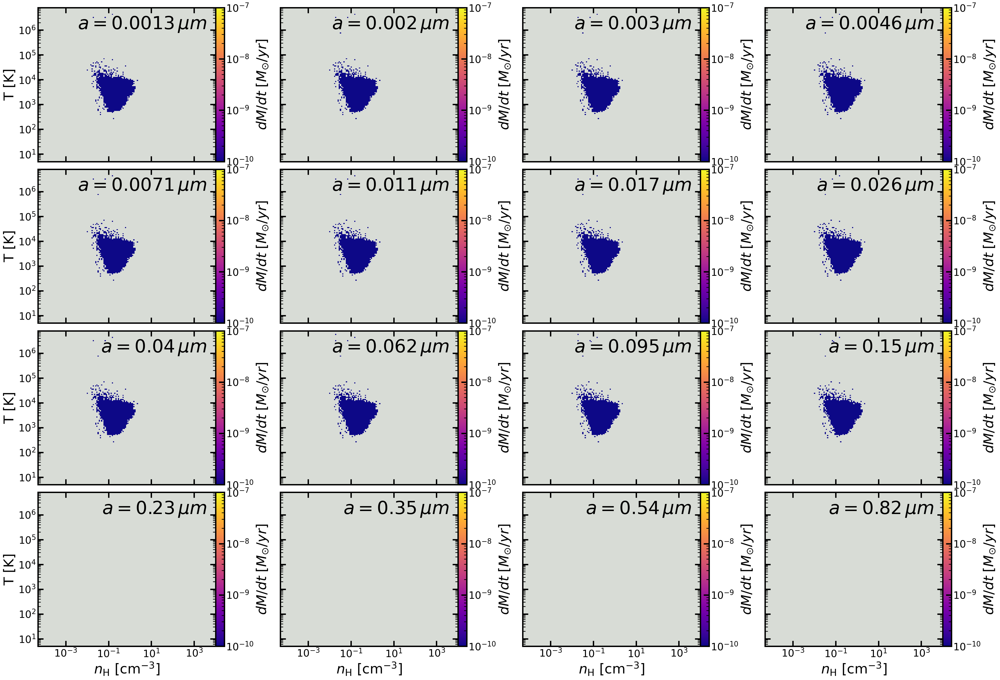

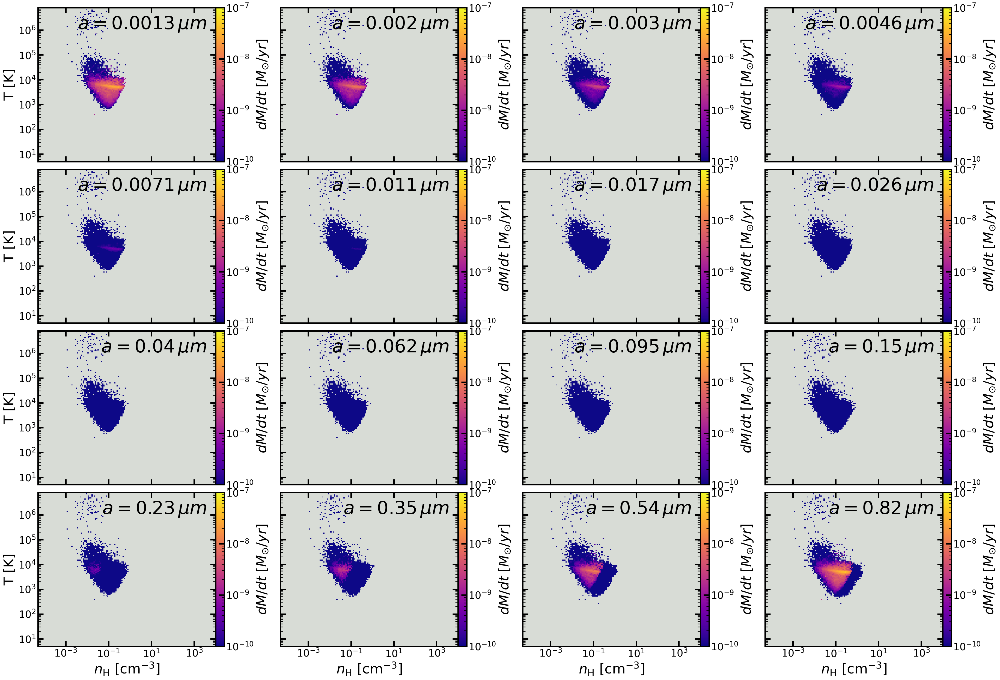

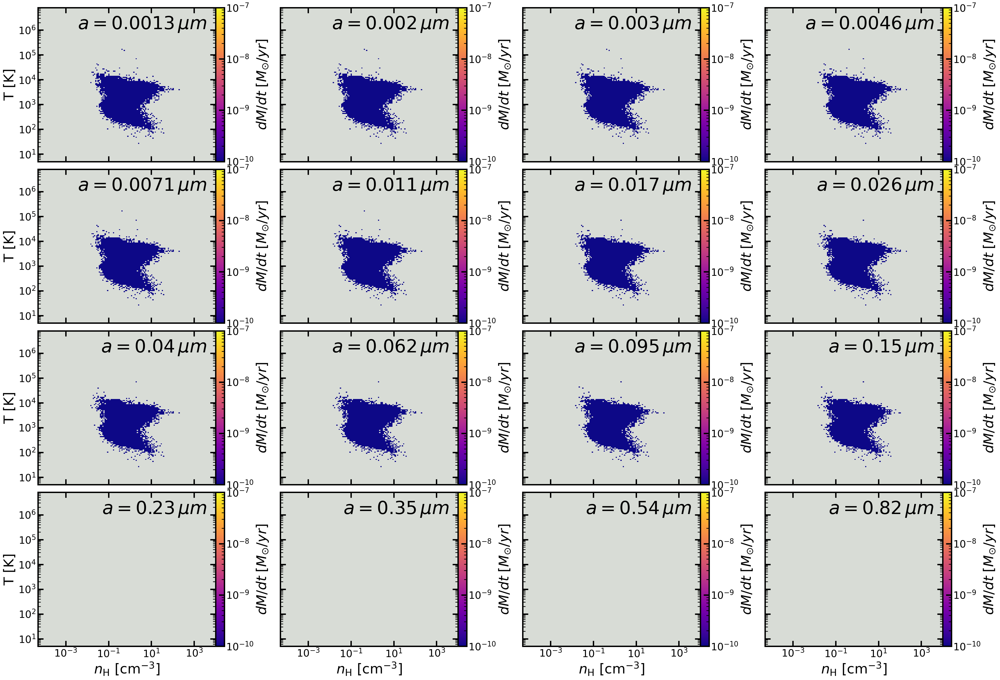

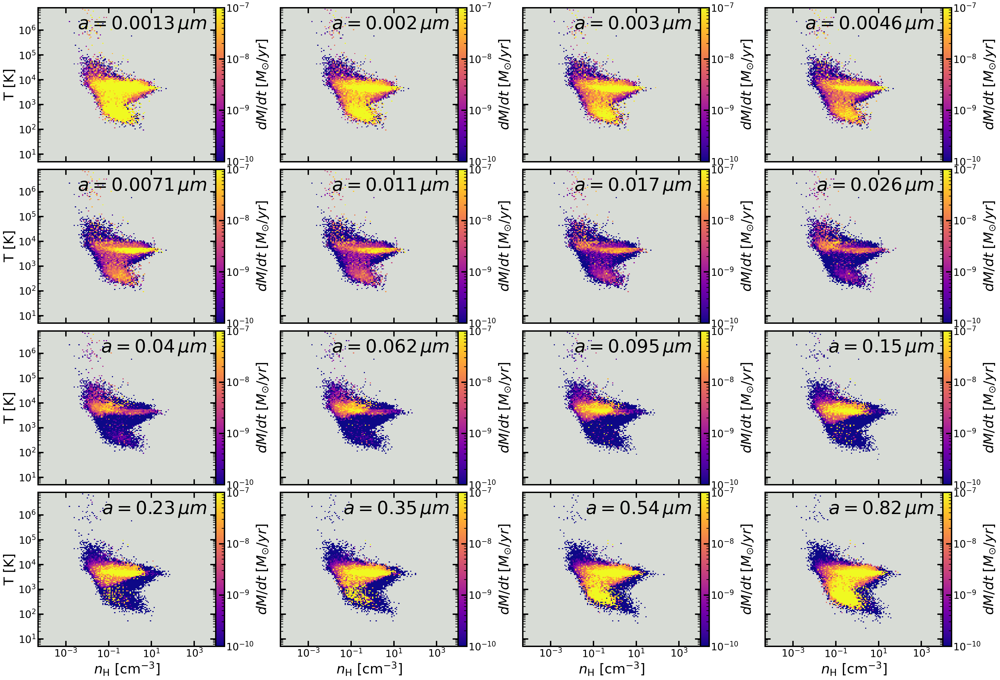

In [62]:

props = ['dMdt_coag','dMdt_shat']
fig_labels = ['coagulation','shattering']
spec_ind = 0
z_log=True
# Number of bins across nH and T space
bin_nums = 150
cmap='plasma'
# nH and T limits
nH_lims = [5E-5,1E4]
T_lims = [5,8E6]


coag_lim=[1E-7,1E-4]
shat_lim=[1E-10,1E-7]


for i,halo in enumerate(halos):
    sp = halo.sp
    print(sp.sdir)
    name = sim_names[i]

    grain_bins = halo.sp.Flag_GrainSizeBins
    a_centers = halo.sp.Grain_Bin_Centers

    G = halo.loadpart(0)


    foutname = 'shat_pos_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    shat_rate = G.get_property('grain_shat_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        shat_rate[shat_rate<0] = 0
        ret = calc.calc_phase_hist_data(shat_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=shat_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)

    foutname = 'shat_neg_dMdt_phase_diagram.pdf'
    fig = Figure(grain_bins,ncols=4, sharex='col',sharey='row')
    shat_rate = G.get_property('grain_shat_rate')
    for j in range(grain_bins):
        a_center = a_centers[j]
        # Set up for each plot
        fig.set_axis(j, 'nH', 'T', x_lim=nH_lims, x_log=True, y_lim=T_lims, y_log=True, face_color='xkcd:light grey')

        shat_rate[shat_rate>0] = 0
        ret = calc.calc_phase_hist_data(-shat_rate[:,spec_ind,j], halo, bin_nums=bin_nums, nH_lims=nH_lims, T_lims=T_lims, bin_func='sum')

        ret.statistic[ret.statistic == 0] = np.nan

        X, Y = np.meshgrid(ret.x_edge, ret.y_edge)
        fig.plot_2Dhistogram(j, 'dMdt', X, Y, ret.statistic.T, cmap=cmap, z_lim=shat_lim, z_log=z_log,label=r'$a=%1.2g\,\mu m$'%a_center)

        # Add colorbar to last axis
        fig.add_colorbar(j,cbar_prop='dMdt')

    fig.save(plot_dir+name+'_'+str(snap_num)+'_'+foutname)
